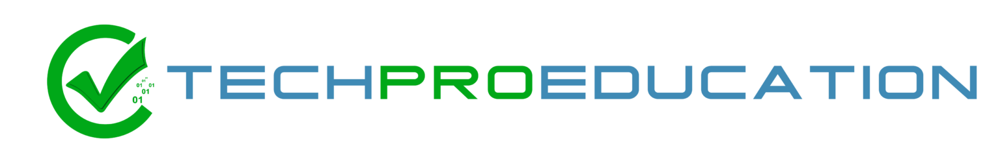

# **Adult Income Prediction**

**Data Set Information:**

This dataset was obtained from UCI Machine Learning Repository. The aim of this problem is to classify adults in two different groups based on their income where group 1 has an income less than USD 50k and group 2 has an income of more than or equal to USD 50k. The data available at hand comes from Census 1994.


**Attribute Information:**

Age: Describes the age of individuals. Continuous.

Workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.

fnlwgt: Continuous.

education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool.

education-num: Number of years spent in education. Continuous.

marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.

occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.

relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.

race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.

sex: Female, Male.

capital-gain: Continuous.

capital-loss: Continuous.

hours-per-week: Continuous.

native-country: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.

salary: >50K,<=50K

# Importing Libraries

In [1]:
# EDA için kütüphaneler
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import cufflinks as cf

from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()

# Grafikleri göstermek için
%matplotlib inline
plt.rcParams['figure.figsize'] = 10, 6

# Makine öğrenmesi algoritmaları, veri ön işleme ve değerlendirme için sklearn kütüphanesi
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss, recall_score, accuracy_score, precision_score, f1_score
from sklearn.pipeline import Pipeline
from sklearn.metrics import roc_auc_score, auc
from sklearn.metrics import confusion_matrix, classification_report, plot_confusion_matrix
# Uyarılardan kurtulmak için
import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

In [2]:
df = pd.read_csv('adult.csv')

In [3]:
df_dummy = df.copy

In [4]:
df.head()

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [5]:
df.sample(10)

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
2837,28,Private,233796,Some-college,10,Married-civ-spouse,Adm-clerical,Wife,White,Female,7298,0,32,United-States,>50K
27587,53,Private,64322,HS-grad,9,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,40,United-States,<=50K
25780,18,Private,89419,HS-grad,9,Never-married,Tech-support,Own-child,White,Female,0,0,10,United-States,<=50K
5340,47,Private,386136,HS-grad,9,Married-civ-spouse,Transport-moving,Husband,White,Male,0,0,35,United-States,<=50K
11820,53,Private,31460,HS-grad,9,Divorced,Prof-specialty,Not-in-family,White,Male,0,0,40,United-States,<=50K
5669,46,Private,99835,Prof-school,15,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,60,United-States,>50K
19225,27,Self-emp-inc,114158,Bachelors,13,Never-married,Exec-managerial,Own-child,White,Female,0,0,40,United-States,<=50K
14742,39,State-gov,24721,Some-college,10,Divorced,Adm-clerical,Unmarried,White,Female,0,0,35,United-States,<=50K
23299,42,Private,280410,HS-grad,9,Married-civ-spouse,Other-service,Husband,Black,Male,0,0,40,Haiti,<=50K
16692,36,Private,43701,Some-college,10,Widowed,Sales,Not-in-family,White,Female,0,0,20,United-States,<=50K


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education.num   32561 non-null  int64 
 5   marital.status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital.gain    32561 non-null  int64 
 11  capital.loss    32561 non-null  int64 
 12  hours.per.week  32561 non-null  int64 
 13  native.country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [7]:
df.value_counts('income')

income
<=50K    24720
>50K      7841
dtype: int64

In [8]:
# Alternative code:
# df['income']=df['income'].map({'<=50K': 0, '>50K': 1}) 
df['income'] = df['income'].apply(lambda x: 0 if x =='<=50K' else 1)
df

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,0
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,0
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,0
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,0
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,22,Private,310152,Some-college,10,Never-married,Protective-serv,Not-in-family,White,Male,0,0,40,United-States,0
32557,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,0
32558,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,1
32559,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,0


In [9]:
# Veri setinin genel bir profilini elde etmek için
# Gözlem sayısı-veri tipi-null değer sayısı-unique değer sayısı-min-max değerleri
# null değerler "0" gözüküyor!

def summary(df, pred=None):
    obs = df.shape[0]
    Types = df.dtypes
    Counts = df.apply(lambda x: x.count())
    Min = df.min()
    Max = df.max()
    Uniques = df.apply(lambda x: x.unique().shape[0])
    Nulls = df.apply(lambda x: x.isnull().sum())
    print('Data shape:', df.shape)

    if pred is None:
        cols = ['Types', 'Counts', 'Uniques', 'Nulls', 'Min', 'Max']
        str = pd.concat([Types, Counts, Uniques, Nulls, Min, Max], axis = 1, sort=True)

    str.columns = cols
    print('___________________________\nData Types:')
    print(str.Types.value_counts())
    print('___________________________')
    return str

summary(df)

Data shape: (32561, 15)
___________________________
Data Types:
object    8
int64     7
Name: Types, dtype: int64
___________________________


,Types,Counts,Uniques,Nulls,Min,Max
age,int64,32561,73,0,17,90
capital.gain,int64,32561,119,0,0,99999
capital.loss,int64,32561,92,0,0,4356
education,object,32561,16,0,10th,Some-college
education.num,int64,32561,16,0,1,16
fnlwgt,int64,32561,21648,0,12285,1484705
hours.per.week,int64,32561,94,0,1,99
income,int64,32561,2,0,0,1
marital.status,object,32561,7,0,Divorced,Widowed
native.country,object,32561,42,0,?,Yugoslavia


In [10]:
# Veri setindeki yinelenen gözlemleri kontrol eder ve bunları kaldırır

def duplicate_values(df):
    print("Duplicate check...")
    num_duplicates = df.duplicated(subset=None, keep='first').sum()
    if num_duplicates > 0:
        print("There are", num_duplicates, "duplicated observations in the dataset.")
        df.drop_duplicates(keep='first', inplace=True)
        print(num_duplicates, "duplicates were dropped!")
        print("No more duplicate rows!")
    else:
        print("There are no duplicated observations in the dataset.")

In [11]:
duplicate_values(df)

Duplicate check...
There are 24 duplicated observations in the dataset.
24 duplicates were dropped!
No more duplicate rows!


In [12]:
df.describe(include="object").T

,count,unique,top,freq
workclass,32537,9,Private,22673
education,32537,16,HS-grad,10494
marital.status,32537,7,Married-civ-spouse,14970
occupation,32537,15,Prof-specialty,4136
relationship,32537,6,Husband,13187
race,32537,5,White,27795
sex,32537,2,Male,21775
native.country,32537,42,United-States,29153


In [13]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,32537.0,38.585549,13.637984,17.0,28.0,37.0,48.0,90.0
fnlwgt,32537.0,189780.848511,105556.471009,12285.0,117827.0,178356.0,236993.0,1484705.0
education.num,32537.0,10.081815,2.571633,1.0,9.0,10.0,12.0,16.0
capital.gain,32537.0,1078.443741,7387.957424,0.0,0.0,0.0,0.0,99999.0
capital.loss,32537.0,87.368227,403.101833,0.0,0.0,0.0,0.0,4356.0
hours.per.week,32537.0,40.440329,12.346889,1.0,40.0,40.0,45.0,99.0
income,32537.0,0.240926,0.427652,0.0,0.0,0.0,0.0,1.0


# Missing  & Inappropriate value check

In [14]:
# Veri setindeki null değerleri tespit eder, sayı ve yüzde olarak sıralar

def missing_values(df):
    missing_number = df.isnull().sum().sort_values(ascending = False)
    missing_percent = (df.isnull().sum() / df.isnull().count()).sort_values(ascending = False)
    missing_values = pd.concat([missing_number, missing_percent], axis = 1, keys = ['Missing_Number', 'Missing_Percent'])
    return missing_values[missing_values['Missing_Number'] > 0]

In [15]:
missing_values(df)

,Missing_Number,Missing_Percent


In [16]:
# Veri setindeki tüm '?' değerlerini NaN ile değiştirir

df.replace(to_replace='?',value=np.nan,inplace=True)

#df=df.applymap(lambda x: np.nan if x=='?' else x)

In [17]:
missing_values(df)

,Missing_Number,Missing_Percent
occupation,1843,0.056643
workclass,1836,0.056428
native.country,582,0.017887


## Filling occupation values

In [18]:
df['occupation'].value_counts(normalize=True)

Prof-specialty       0.134749
Craft-repair         0.133381
Exec-managerial      0.132436
Adm-clerical         0.122760
Sales                0.118916
Other-service        0.107220
Machine-op-inspct    0.065159
Transport-moving     0.052030
Handlers-cleaners    0.044602
Farming-fishing      0.032319
Tech-support         0.030201
Protective-serv      0.021144
Priv-house-serv      0.004789
Armed-Forces         0.000293
Name: occupation, dtype: float64

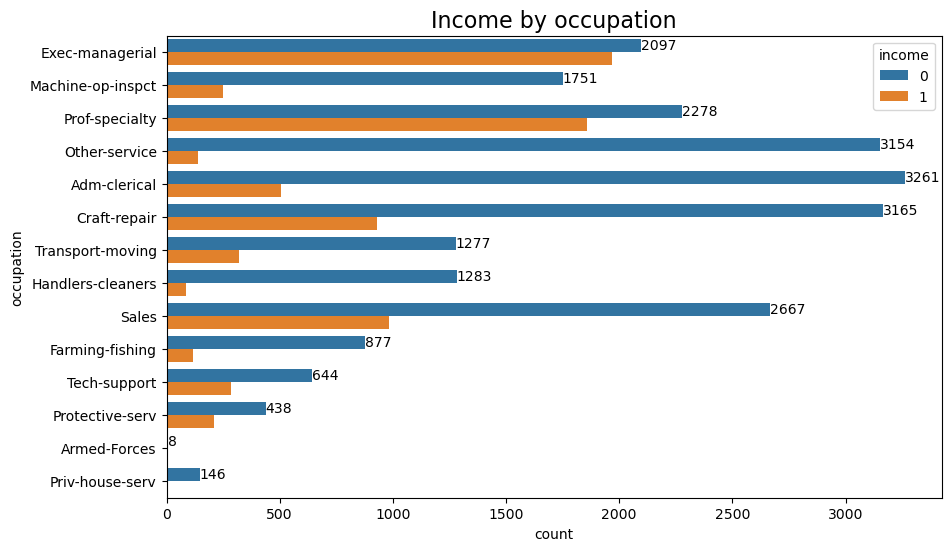

In [19]:
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['occupation'], hue = df['income'])
plt.title("Income by occupation", fontsize = 16)
ax.bar_label(ax.containers[0]);

In [20]:
df['occupation'] = df['occupation'].fillna(method = 'bfill')

In [21]:
missing_values(df)

,Missing_Number,Missing_Percent
workclass,1836,0.056428
native.country,582,0.017887


## Filling workclass values

In [22]:
df['workclass'].value_counts(normalize=True)

Private             0.738510
Self-emp-not-inc    0.082733
Local-gov           0.068174
State-gov           0.042279
Self-emp-inc        0.036351
Federal-gov         0.031269
Without-pay         0.000456
Never-worked        0.000228
Name: workclass, dtype: float64

In [23]:
df['workclass'].isna().sum()

1836

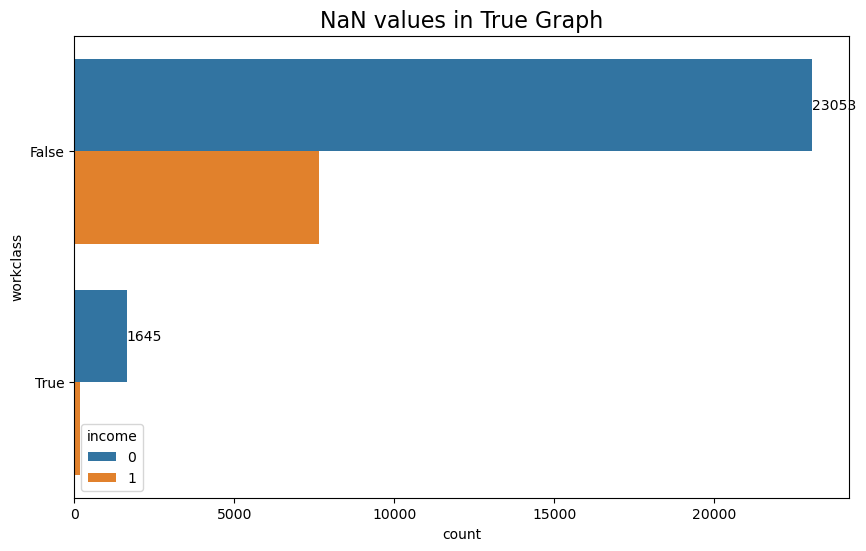

In [24]:
# Looking for NaN values represented as True in the graph below.
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['workclass'].isna(), hue = df['income'])
plt.title("NaN values in True Graph", fontsize = 16)
ax.bar_label(ax.containers[0]);

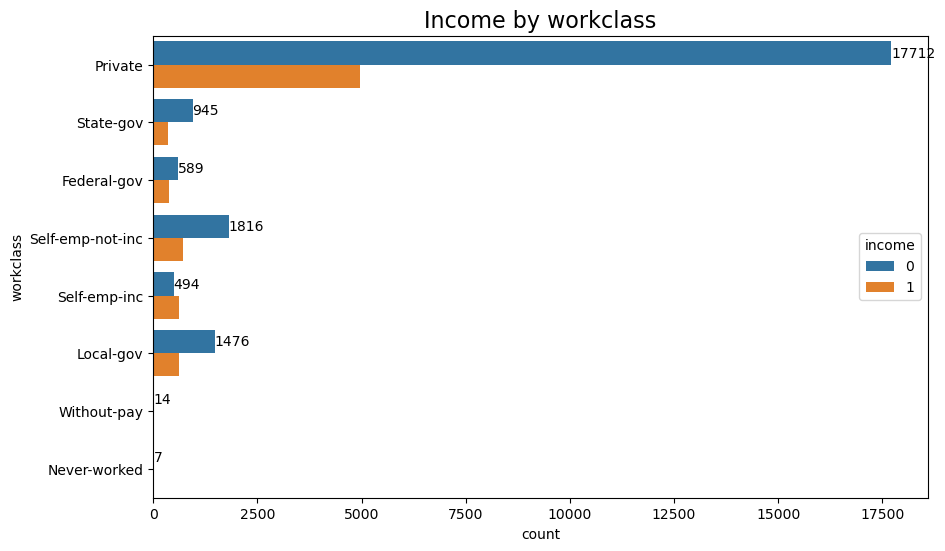

In [25]:
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['workclass'], hue = df['income'])
plt.title("Income by workclass", fontsize = 16)
ax.bar_label(ax.containers[0]);

### After realising that NaN values distribution is not exactly similar to any other types of workclass.Even if it was, the data set could be manipulated in a wrong way with that decision, needed to further check. However, it is close to Private and Private has the biggest share already. So, the NaN values will be put in Private

In [26]:
df['workclass'] = df['workclass'].fillna('Private')

In [27]:
missing_values(df)

,Missing_Number,Missing_Percent
native.country,582,0.017887


## Filling native.country values

In [28]:
df['native.country'].value_counts(normalize = True)

United-States                 0.912314
Mexico                        0.019997
Philippines                   0.006196
Germany                       0.004287
Canada                        0.003787
Puerto-Rico                   0.003568
El-Salvador                   0.003317
India                         0.003129
Cuba                          0.002973
England                       0.002816
Jamaica                       0.002535
South                         0.002504
China                         0.002347
Italy                         0.002284
Dominican-Republic            0.002191
Vietnam                       0.002097
Guatemala                     0.001940
Japan                         0.001940
Poland                        0.001878
Columbia                      0.001846
Taiwan                        0.001596
Haiti                         0.001377
Iran                          0.001346
Portugal                      0.001158
Nicaragua                     0.001064
Peru                     

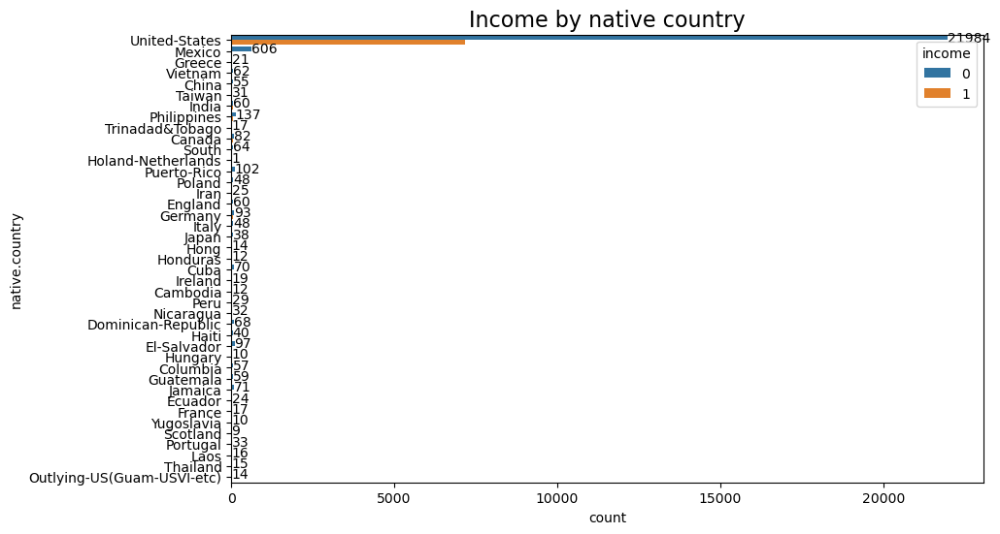

In [29]:
plt.figure(figsize = (10,6))
ax = sns.countplot(y = df['native.country'], hue = df['income'])
plt.title("Income by native country", fontsize = 16)
ax.bar_label(ax.containers[0]);

In [30]:
# Filling values with united-states which holds 91 percent of the column.
df['native.country'] = df['native.country'].fillna('United-States')

In [31]:
missing_values(df)

,Missing_Number,Missing_Percent


### No more missing or duplicated values in Data set

## Target variable = income

In [32]:
print(df.income.value_counts())
print(df.income.value_counts(normalize = True))


0    24698
1     7839
Name: income, dtype: int64
0    0.759074
1    0.240926
Name: income, dtype: float64


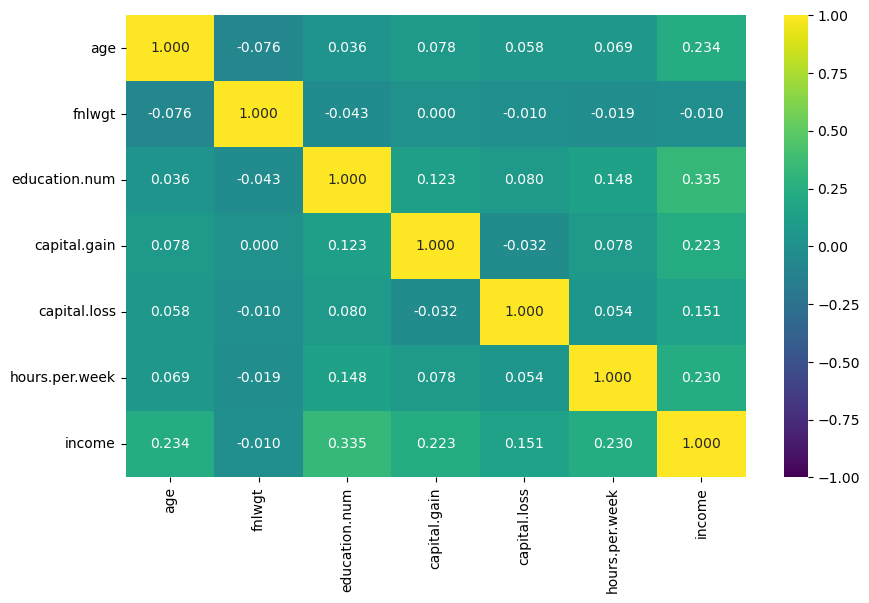

In [33]:
numeric_df = df.select_dtypes(include=[np.number])
sns.heatmap(numeric_df.corr(),vmin=-1,vmax=1, annot=True, fmt='.3f', cmap='viridis');

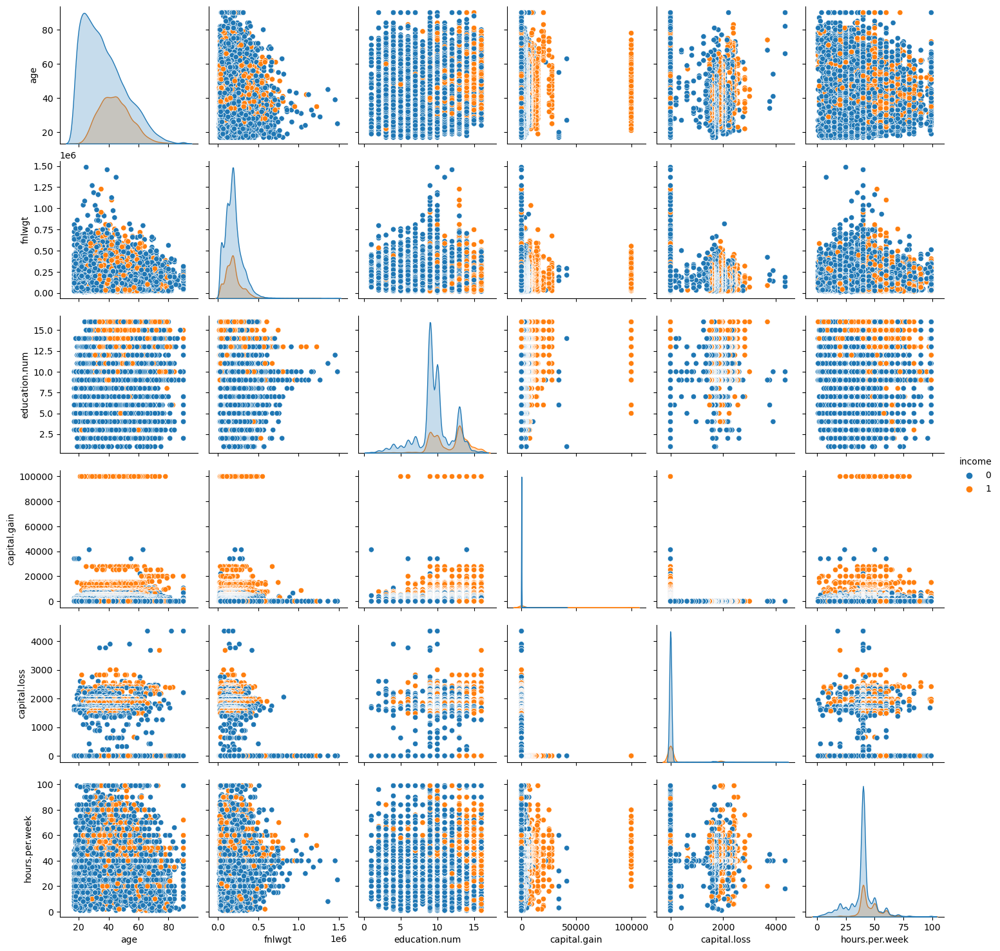

In [34]:
sns.pairplot(df, hue = "income");

# Analysing features one-by-one

### fnlwgt

In [35]:
# It is not important feature here it doesn't represent anything it is just an information about how data entered. Hence, it is dropped here.
df.drop(['fnlwgt'], axis = 1, inplace = True)

## Education and Education Num Combining

In [36]:
# Veri setindeki belirli bir sütunundaki değerlerin dağılımını hızlıca incelemek için 
# Marcus hocanın çözümünden.(diğer bir çok alıntı da mevcut.)

def value_cnt(df, column_name):
    vc = df[column_name].value_counts()
    vc_norm = df[column_name].value_counts(normalize=True)

    vc = vc.rename_axis(column_name).reset_index(name='counts')
    vc_norm = vc_norm.rename_axis(column_name).reset_index(name='norm_counts')

    df_result = pd.concat([vc[column_name], vc['counts'], vc_norm['norm_counts']], axis=1)
    
    return df_result

In [37]:
value_cnt(df, 'education')

,education,counts,norm_counts
0,HS-grad,10494,0.322525
1,Some-college,7282,0.223807
2,Bachelors,5353,0.164520
3,Masters,1722,0.052924
4,Assoc-voc,1382,0.042475
5,11th,1175,0.036113
6,Assoc-acdm,1067,0.032793
7,10th,933,0.028675
8,7th-8th,645,0.019824
9,Prof-school,576,0.017703


In [38]:
# Grade level details on education numbers seemed excessive and not necessary , so grouping them into 'School' will make EDA much simpler.
df['education'].replace(['11th', '9th', '7th-8th', '5th-6th', '10th', '1st-4th', '12th'], 'School', inplace = True)

In [39]:
px.histogram(df, x='education', color=df.income, barmode='group', title='Income Distribution by Education Level')

In [40]:
px.histogram(df, x='education.num', color="income", barmode='group', title='Income Distribution by Education Num')

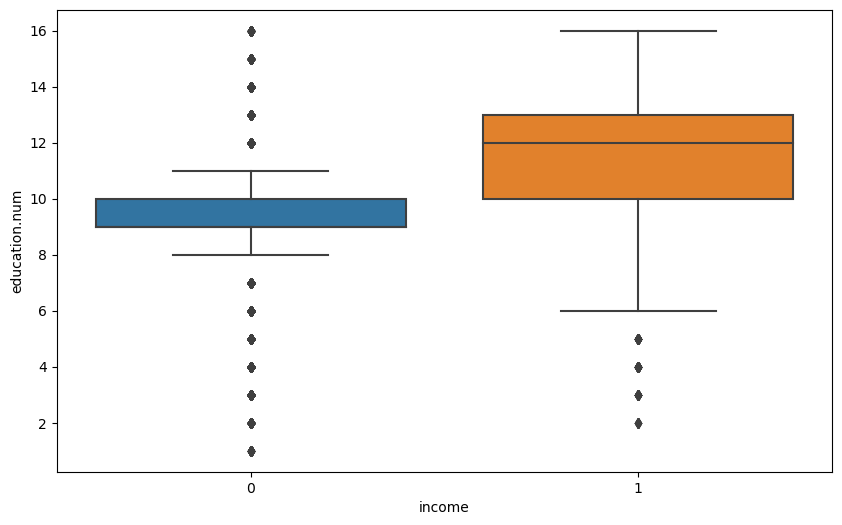

In [41]:
sns.boxplot(data=df,y="education.num",x='income');

In [42]:
# Alternative potential Drop column.
# It seemed same information with education column. It is just the representation of years spent in education.
# df.drop(['education.num'], axis = 1, inplace = True)

## Age

In [43]:
# value_cnt function is not applied to age column due to too many unique values
px.histogram(df, x='age', color="income", barmode='group', title='Income Distribution by Age')

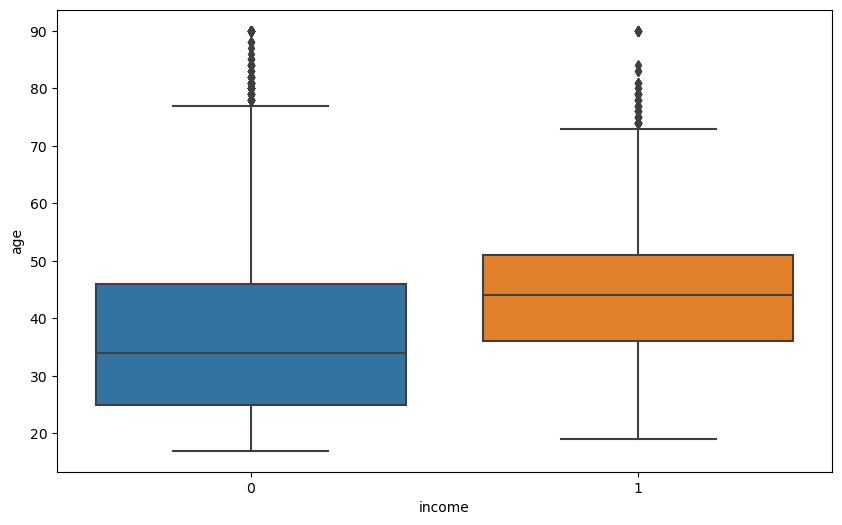

In [44]:
sns.boxplot(data=df,y="age",x='income');

## Workclass

In [45]:
value_cnt(df, 'workclass')

,workclass,counts,norm_counts
0,Private,24509,0.753266
1,Self-emp-not-inc,2540,0.078065
2,Local-gov,2093,0.064327
3,State-gov,1298,0.039893
4,Self-emp-inc,1116,0.034299
5,Federal-gov,960,0.029505
6,Without-pay,14,0.000430
7,Never-worked,7,0.000215


In [46]:
px.histogram(df, x='workclass', color="income", barmode='group', title='Income Distribution by Work Class')

## Martial Status

In [47]:
value_cnt(df, 'marital.status')

,marital.status,counts,norm_counts
0,Married-civ-spouse,14970,0.460092
1,Never-married,10667,0.327842
2,Divorced,4441,0.136491
3,Separated,1025,0.031503
4,Widowed,993,0.030519
5,Married-spouse-absent,418,0.012847
6,Married-AF-spouse,23,0.000707


In [48]:
px.histogram(df, x='marital.status', color="income", barmode='group', title='Income Distribution by Marital Status')

## Occupation

In [49]:
value_cnt(df, 'occupation')

,occupation,counts,norm_counts
0,Prof-specialty,4394,0.135046
1,Craft-repair,4326,0.132956
2,Exec-managerial,4274,0.131358
3,Adm-clerical,3989,0.122599
4,Sales,3860,0.118634
5,Other-service,3516,0.108062
6,Machine-op-inspct,2126,0.065341
7,Transport-moving,1685,0.051787
8,Handlers-cleaners,1464,0.044995
9,Farming-fishing,1069,0.032855


In [50]:
px.histogram(df, x='occupation', color="income", barmode='group', title='Income Distribution by Occupation')

## Relationship

In [51]:
value_cnt(df, 'relationship')

,relationship,counts,norm_counts
0,Husband,13187,0.405292
1,Not-in-family,8292,0.254848
2,Own-child,5064,0.155638
3,Unmarried,3445,0.105879
4,Wife,1568,0.048191
5,Other-relative,981,0.030150


In [52]:
px.histogram(df, x='relationship', color="income", barmode='group', title='Income Distribution by Relationship')

## Race

In [53]:
value_cnt(df, 'race')

,race,counts,norm_counts
0,White,27795,0.854258
1,Black,3122,0.095952
2,Asian-Pac-Islander,1038,0.031902
3,Amer-Indian-Eskimo,311,0.009558
4,Other,271,0.008329


In [54]:
df['race'].replace(['Asian-Pac-Islander', 'Amer-Indian-Eskimo', 'Other'],' Others', inplace = True)

In [55]:
px.histogram(df, x='race', color="income", barmode='group', title='Income Distribution by Race')

## Sex

In [56]:
value_cnt(df, 'sex')

,sex,counts,norm_counts
0,Male,21775,0.669238
1,Female,10762,0.330762


In [57]:
px.histogram(df, x='sex', color="income", barmode='group', title='Income Distribution by Sex')

## Capital gain and Capital loss

In [58]:
# Combine capital gain and loss to calculate net capital of the individual.
# Then, split these values into two categories 'High' and 'Low' to handle data easier.
df['capital_net'] = df['capital.gain'] - df['capital.loss']
df['capital_net'] = pd.cut(df['capital_net'], bins = [-5000, 5000, 100000], labels = ['Low', 'High'])
df['capital_net'] = df['capital_net'].astype('object')
df.drop(['capital.gain'], axis = 1, inplace = True)
df.drop(['capital.loss'], axis = 1, inplace = True)

In [59]:
value_cnt(df, 'capital_net')

,capital_net,counts,norm_counts
0,Low,30889,0.94935
1,High,1648,0.05065


In [60]:
px.histogram(df, x='capital_net', color="income", barmode='group', title='Income Distribution by Capital Net')

## Hours per week

In [61]:
px.histogram(df, x='hours.per.week', color="income", barmode='group', title='Income Distribution by Hours per Week')

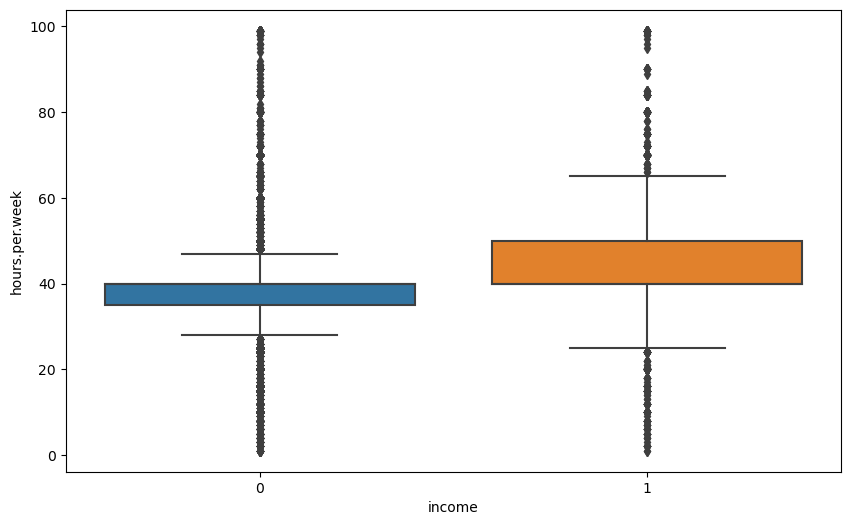

In [62]:
sns.boxplot(data=df,y="hours.per.week",x='income');

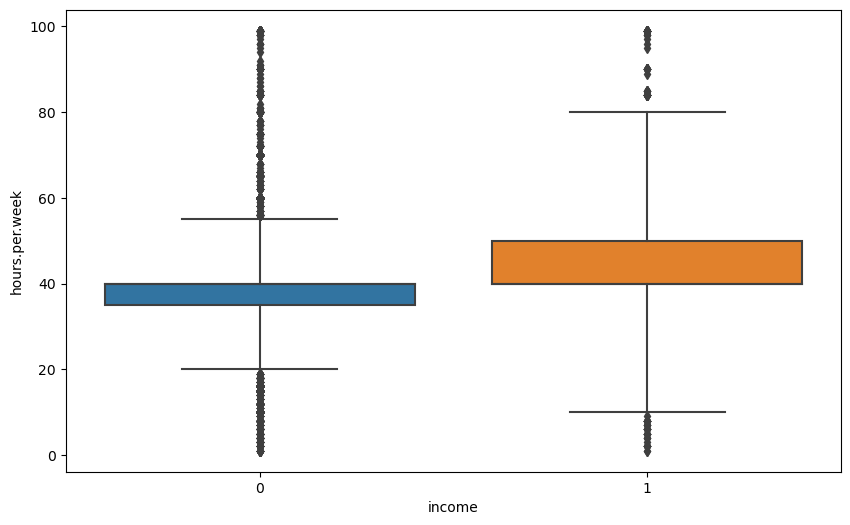

In [63]:
sns.boxplot(data=df,y="hours.per.week",x='income', whis=3);

In [64]:
# For less work hours 4 Hours a day for 5 weekdays is chosen logically
# For more work hours 10 hours a day for all 7 days of the week is chosen logically

In [65]:
print(len(df[df["hours.per.week"]>70]))
print(len(df[df["hours.per.week"]<20]))

498
1700


In [66]:
len(df[(df["hours.per.week"] > 70) | (df["hours.per.week"] < 20)])

2198

## Native country

In [67]:
value_cnt(df, 'native.country')

,native.country,counts,norm_counts
0,United-States,29735,0.913883
1,Mexico,639,0.019639
2,Philippines,198,0.006085
3,Germany,137,0.004211
4,Canada,121,0.003719
5,Puerto-Rico,114,0.003504
6,El-Salvador,106,0.003258
7,India,100,0.003073
8,Cuba,95,0.002920
9,England,90,0.002766


In [68]:
px.histogram(df, x='native.country', color="income", barmode='group', title='Income Distribution by Native Country')

In [69]:
df['native.country'].loc[df['native.country'] != 'United-States'] = 'Others'

In [70]:
value_cnt(df, 'native.country')

,native.country,counts,norm_counts
0,United-States,29735,0.913883
1,Others,2802,0.086117


In [71]:
px.histogram(df, x='native.country', color="income", barmode='group', title='Income Distribution by Native Country')

## Copying our ready Data after EDA process. For further Machine Learning.

In [72]:
df1 = df.copy

In [73]:
df.to_excel('after_EDA.xlsx', index=False)

# Re-run start with corrected data

In [74]:
df = pd.read_excel('after_EDA.xlsx')

# Train and Test split

In [75]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32537 entries, 0 to 32536
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32537 non-null  int64 
 1   workclass       32537 non-null  object
 2   education       32537 non-null  object
 3   education.num   32537 non-null  int64 
 4   marital.status  32537 non-null  object
 5   occupation      32537 non-null  object
 6   relationship    32537 non-null  object
 7   race            32537 non-null  object
 8   sex             32537 non-null  object
 9   hours.per.week  32537 non-null  int64 
 10  native.country  32537 non-null  object
 11  income          32537 non-null  int64 
 12  capital_net     32537 non-null  object
dtypes: int64(4), object(9)
memory usage: 3.2+ MB


In [76]:
X= df.drop(columns="income")
y= df.income

In [77]:
# veri setim unbalanced olduğundan stratify=y kullanıyorum

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=101)

In [78]:
cat_onehot = ['workclass', 'occupation', 'relationship', 'race', 'sex', 'native.country', 'marital.status']
cat_ordinal = ['education', 'capital_net']
    
cat_for_edu = ['Preschool', 'School', 'HS-grad','Some-college', 'Assoc-voc', 'Assoc-acdm','Bachelors', 'Masters', 'Prof-school', 'Doctorate']
cat_for_capdiff = ['Low', 'High']
# sıralamaları bizim yapmamız daha iyi sonuç verir OrdinalEncoder için.

In [79]:
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder

column_trans = make_column_transformer((OneHotEncoder(handle_unknown="ignore", sparse=False), cat_onehot), 
                                       (OrdinalEncoder(categories= [cat_for_edu, cat_for_capdiff]), cat_ordinal),
                                       remainder='passthrough') # MinMaxScaler()


# make_column_transformer fonksiyonu featurlara yapılacak dönüşümleri otomotize eder. Bu fonksiyonun içerisine vereceğimiz
# sıralamaya göre featurlara sıra ile dönüşüm uygular. (Drop First Default yapıyor!)

# (OneHotEncoder(handle_unknown="ignore", sparse=False), cat_onehot) kodu ne yapar?
# handle_unknown = "ignore" parametresi ile test setinde geçip train setinde geçmeyen kategorik verilerin tümü # normalde 'error' olmalı data seti iyi dağıldığından emin olmak için
# 0'a dönüştürecek şekilde cat_onehot listesinde bulunan bütün featurlara onehotencoder dönüşümü yapar.

# (OrdinalEncoder(categories=categories), cat_ordinal) kodu ne yapar?
# ilgili featurlara onehotencoder dönüşümü yapıldıktan sonra cat_ordinal listesinde bulunan bütün featurlara categories
# listesi içerisindeki unique kategorik gözlemlerin hiyerarşik sıralamasına göre ordinal encoder dönüşümü yapar.

# remainder='passthrough' ile dönüşüm yapılmayan diğer tüm featurları olduğu gibi bırak anlamına gelir.
# eğer remainder defaul değeri ile "drop" olarak bırakılırsa dönüşüm yapılmayan tüm featurlar df'den drop edilir.
# remainder= MinMaxScaler() veya StandardScale() yaparsak dönüşüm yapılmayan featurlar haricindeki diğer featurlara
# scale işlem uygulanır.

### Checking the numbers to make sure results are distributed proportionally both in Train and Test dataframe.

In [80]:
X_train.capital_net.value_counts()

Low     24703
High     1326
Name: capital_net, dtype: int64

In [81]:
X_test.capital_net.value_counts()

Low     6186
High     322
Name: capital_net, dtype: int64

In [82]:
column_trans.fit_transform(X_train)

array([[ 0.,  0.,  0., ..., 22., 13., 50.],
       [ 0.,  0.,  0., ..., 22.,  9., 40.],
       [ 0.,  0.,  0., ..., 43., 13., 50.],
       ...,
       [ 0.,  0.,  0., ..., 21., 13., 25.],
       [ 0.,  0.,  0., ..., 35.,  9., 40.],
       [ 0.,  0.,  0., ..., 62.,  9., 65.]])

In [83]:
X_train_trans = column_trans.fit_transform(X_train)
X_test_trans = column_trans.transform(X_test)

In [84]:
X_train_trans.shape, X_test_trans.shape

((26029, 47), (6508, 47))

## This part is added just to have in this notebook for extra information (not mandatory part up to logistic regression)

In [85]:
column_trans.get_feature_names_out()

array(['onehotencoder__workclass_Federal-gov',
       'onehotencoder__workclass_Local-gov',
       'onehotencoder__workclass_Never-worked',
       'onehotencoder__workclass_Private',
       'onehotencoder__workclass_Self-emp-inc',
       'onehotencoder__workclass_Self-emp-not-inc',
       'onehotencoder__workclass_State-gov',
       'onehotencoder__workclass_Without-pay',
       'onehotencoder__occupation_Adm-clerical',
       'onehotencoder__occupation_Armed-Forces',
       'onehotencoder__occupation_Craft-repair',
       'onehotencoder__occupation_Exec-managerial',
       'onehotencoder__occupation_Farming-fishing',
       'onehotencoder__occupation_Handlers-cleaners',
       'onehotencoder__occupation_Machine-op-inspct',
       'onehotencoder__occupation_Other-service',
       'onehotencoder__occupation_Priv-house-serv',
       'onehotencoder__occupation_Prof-specialty',
       'onehotencoder__occupation_Protective-serv',
       'onehotencoder__occupation_Sales',
       'onehotencod

In [86]:
features = column_trans.get_feature_names_out()

In [87]:
X_train= pd.DataFrame(X_train_trans, columns=features, index=X_train.index)
X_train.head()

,onehotencoder__workclass_Federal-gov,onehotencoder__workclass_Local-gov,onehotencoder__workclass_Never-worked,onehotencoder__workclass_Private,onehotencoder__workclass_Self-emp-inc,onehotencoder__workclass_Self-emp-not-inc,onehotencoder__workclass_State-gov,onehotencoder__workclass_Without-pay,onehotencoder__occupation_Adm-clerical,onehotencoder__occupation_Armed-Forces,...,onehotencoder__marital.status_Married-civ-spouse,onehotencoder__marital.status_Married-spouse-absent,onehotencoder__marital.status_Never-married,onehotencoder__marital.status_Separated,onehotencoder__marital.status_Widowed,ordinalencoder__education,ordinalencoder__capital_net,remainder__age,remainder__education.num,remainder__hours.per.week
15728,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,6.0,0.0,22.0,13.0,50.0
14006,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,2.0,0.0,22.0,9.0,40.0
11989,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,6.0,0.0,43.0,13.0,50.0
21162,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,2.0,0.0,20.0,9.0,40.0
32224,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,72.0,3.0,40.0


### Remainders stayed since, scaling process haven't applied to them yet. They are numerical values.

In [88]:
X_test= pd.DataFrame(X_test_trans, columns=features, index=X_test.index)
X_test.head()

,onehotencoder__workclass_Federal-gov,onehotencoder__workclass_Local-gov,onehotencoder__workclass_Never-worked,onehotencoder__workclass_Private,onehotencoder__workclass_Self-emp-inc,onehotencoder__workclass_Self-emp-not-inc,onehotencoder__workclass_State-gov,onehotencoder__workclass_Without-pay,onehotencoder__occupation_Adm-clerical,onehotencoder__occupation_Armed-Forces,...,onehotencoder__marital.status_Married-civ-spouse,onehotencoder__marital.status_Married-spouse-absent,onehotencoder__marital.status_Never-married,onehotencoder__marital.status_Separated,onehotencoder__marital.status_Widowed,ordinalencoder__education,ordinalencoder__capital_net,remainder__age,remainder__education.num,remainder__hours.per.week
12166,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,41.0,6.0,50.0
29401,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,3.0,0.0,22.0,10.0,30.0
5732,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,3.0,0.0,43.0,10.0,60.0
1207,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,3.0,0.0,42.0,10.0,40.0
29837,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,2.0,0.0,28.0,9.0,60.0


In [89]:
corr_by_income = X_train.join(y_train).corr()["income"].sort_values()[:-1]
corr_by_income

# datamızdaki tüm featurların target ile olan corr.larına bakmak için X_train ve y_traini join ediyoruz. Ve targetımız 
# olan price ile corr.larını küçükten büyüğe sıralıyoruz. Targetın kendisiyle olan corr.unu görmek istemediğimizden
# slicelama ([:-1]) yapıp -1 ile targetın kanedisini ignore ediyoruz.

onehotencoder__marital.status_Never-married           -0.317532
onehotencoder__relationship_Own-child                 -0.229712
onehotencoder__sex_Female                             -0.219547
onehotencoder__relationship_Not-in-family             -0.185150
onehotencoder__occupation_Other-service               -0.160737
onehotencoder__relationship_Unmarried                 -0.146660
onehotencoder__workclass_Private                      -0.128308
onehotencoder__marital.status_Divorced                -0.125914
onehotencoder__occupation_Adm-clerical                -0.101012
onehotencoder__occupation_Handlers-cleaners           -0.091809
onehotencoder__race_Black                             -0.089008
onehotencoder__relationship_Other-relative            -0.085901
onehotencoder__marital.status_Separated               -0.075973
onehotencoder__occupation_Machine-op-inspct           -0.074910
onehotencoder__marital.status_Widowed                 -0.066424
onehotencoder__occupation_Farming-fishin

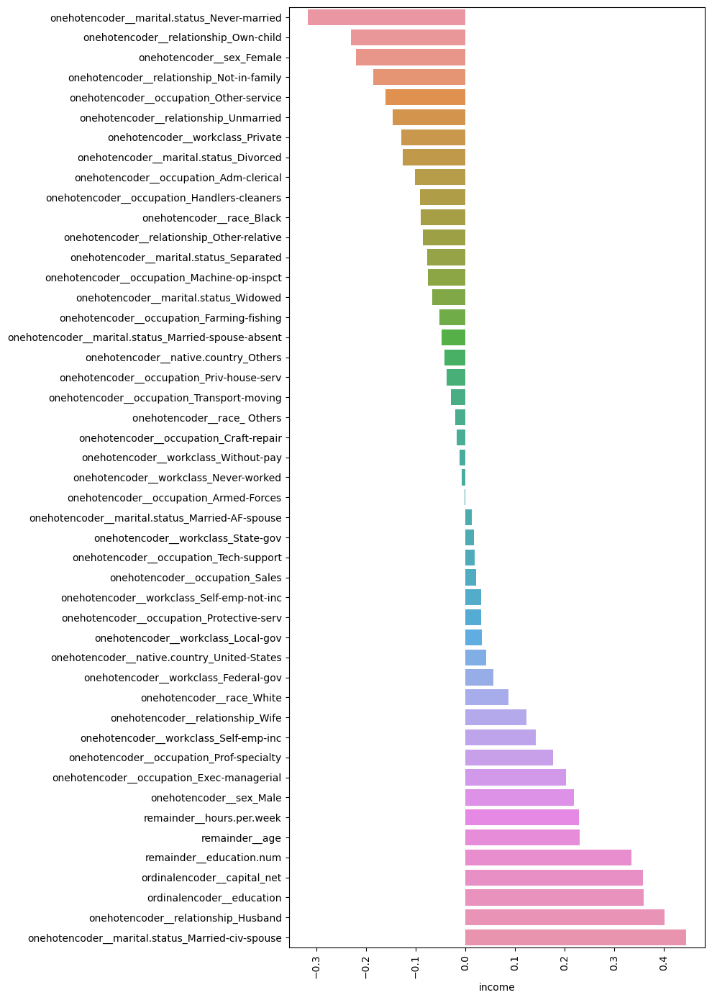

In [90]:
plt.figure(figsize = (10,14))
sns.barplot(y = corr_by_income.index, x = corr_by_income)
plt.xticks(rotation=90)
plt.tight_layout();

# featureler ile target arasındaki corr.ları görselleştiriyoruz.

# Logistic Regression

In [91]:
operations = [("scaler", StandardScaler()), ("logistic", LogisticRegression())]

log_pipe = Pipeline(steps=operations)

log_pipe.fit(X_train, y_train)


Pipeline(steps=[('scaler', StandardScaler()),
                ('logistic', LogisticRegression())])

In [92]:
y_pred = log_pipe.predict(X_test)
y_pred

array([0, 0, 0, ..., 1, 0, 1], dtype=int64)

In [93]:
y_pred_proba = log_pipe.predict_proba(X_test)
y_pred_proba

array([[0.99067818, 0.00932182],
       [0.99795925, 0.00204075],
       [0.62249222, 0.37750778],
       ...,
       [0.19823604, 0.80176396],
       [0.68958324, 0.31041676],
       [0.13436018, 0.86563982]])

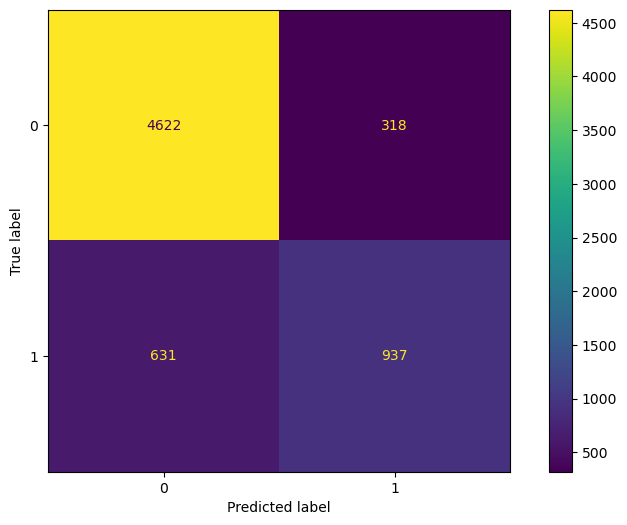

In [94]:
plot_confusion_matrix(log_pipe, X_test, y_test)

In [95]:
def eval_metric(model, X_train, y_train, X_test, y_test):

    """ to get the metrics for the model """

    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))
    

In [96]:
eval_metric(log_pipe, X_train, y_train, X_test, y_test) 

Test_Set
[[4622  318]
 [ 631  937]]
              precision    recall  f1-score   support

           0       0.88      0.94      0.91      4940
           1       0.75      0.60      0.66      1568

    accuracy                           0.85      6508
   macro avg       0.81      0.77      0.79      6508
weighted avg       0.85      0.85      0.85      6508


Train_Set
[[18419  1339]
 [ 2593  3678]]
              precision    recall  f1-score   support

           0       0.88      0.93      0.90     19758
           1       0.73      0.59      0.65      6271

    accuracy                           0.85     26029
   macro avg       0.80      0.76      0.78     26029
weighted avg       0.84      0.85      0.84     26029



## Grid search CV


In [97]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold

operations = [("scaler", StandardScaler()), ("logistic", LogisticRegression())]

log_pipe = Pipeline(steps=operations)

C = [0.01, 0.1, 1]  # C arttıkça regülarizasyon düşer, alphanın tersi olarak
class_weight= ["balanced", None] 
# dengesiz data setlerinde classları dengelemek için class_weight= "balanced" kullanabiliyoruz. 
# class_weight="balanced" kullanarak, modelin az temsil edilen sınıfın örneklerini doğru bir şekilde sınıflandırmaya
# daha fazla odaklanmasını sağlarız, bu genellikle bu sınıfın recall'ını artırabilir.

#solver-penalt hatalarını önlemek için
param_grid = [
    {
        "logistic__penalty" : ['l2', 'none'],
        "logistic__C" : C,
        "logistic__class_weight": class_weight,
        "logistic__solver": ['sag', 'lbfgs']
    },
    {
        "logistic__penalty" : ['l1', 'l2'],
        "logistic__C" : C,
        "logistic__class_weight": class_weight,
        "logistic__solver": ['liblinear', 'saga']
    }
]

cv = StratifiedKFold(n_splits = 10) # unbalanced datalarda kullanılabilir

grid_model = GridSearchCV(estimator=log_pipe,
                          param_grid=param_grid,
                          cv=cv,
                          scoring = "recall",   # Default olarak 1 sınıfının scorunu max. eder. 0 sınıfınınkini max. etmek isterseniz recall_0 = make_scorer(recall_score, pos_label =0)
                          n_jobs = -1,
                          return_train_score=True)


# GrdiseachCV aynı zamanda Cross Validation işlemi de yaptığı için validation ve train seti scorlarını elde edebilmek için
# return_train_score=True olarak belirtiyoruz. (scoring karşına yazdığımız metric scorunu döndürür sadece)

In [98]:
log_pipe.get_params()

{'memory': None,
 'steps': [('scaler', StandardScaler()), ('logistic', LogisticRegression())],
 'verbose': False,
 'scaler': StandardScaler(),
 'logistic': LogisticRegression(),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'logistic__C': 1.0,
 'logistic__class_weight': None,
 'logistic__dual': False,
 'logistic__fit_intercept': True,
 'logistic__intercept_scaling': 1,
 'logistic__l1_ratio': None,
 'logistic__max_iter': 100,
 'logistic__multi_class': 'auto',
 'logistic__n_jobs': None,
 'logistic__penalty': 'l2',
 'logistic__random_state': None,
 'logistic__solver': 'lbfgs',
 'logistic__tol': 0.0001,
 'logistic__verbose': 0,
 'logistic__warm_start': False}

In [99]:
grid_model.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('logistic', LogisticRegression())]),
             n_jobs=-1,
             param_grid=[{'logistic__C': [0.01, 0.1, 1],
                          'logistic__class_weight': ['balanced', None],
                          'logistic__penalty': ['l2', 'none'],
                          'logistic__solver': ['sag', 'lbfgs']},
                         {'logistic__C': [0.01, 0.1, 1],
                          'logistic__class_weight': ['balanced', None],
                          'logistic__penalty': ['l1', 'l2'],
                          'logistic__solver': ['liblinear', 'saga']}],
             return_train_score=True, scoring='recall')

In [100]:
grid_model.best_params_

# best_params_ param_grid içerisine tanımladığım tüm hyper_parametre uzayları içerisindeki 
# en iyi hyper_parameter değerlerini döndürür.

{'logistic__C': 0.01,
 'logistic__class_weight': 'balanced',
 'logistic__penalty': 'l1',
 'logistic__solver': 'liblinear'}

In [101]:
grid_model.best_estimator_

Pipeline(steps=[('scaler', StandardScaler()),
                ('logistic',
                 LogisticRegression(C=0.01, class_weight='balanced',
                                    penalty='l1', solver='liblinear'))])

In [102]:
grid_model.best_score_

0.8539290829854022

In [103]:
grid_model.best_index_

24

In [104]:
pd.DataFrame(grid_model.cv_results_).loc[1, ["mean_test_score", "mean_train_score"]]


# ilgili df'in best indexinden "mean_test_score" ile "mean_train_score" ları çekilip karşılaştırılırak overfitting,
# underfitting değerlendirilmesi yapılır. 

# GridsearchCV aynı zamanda Cross validation işlemi de yaptığından extradan cross validation yapmamıza gerek yok.

# Burda aldığımız scorelar gridsearchcv içerisine verdiğimiz scoring metricinin scorelarıdır.

mean_test_score     0.843563
mean_train_score    0.844788
Name: 1, dtype: object

In [105]:
eval_metric(grid_model, X_train, y_train, X_test, y_test)  

# 0 label'ı için konuşacak olursak. 
# precision 0.94 demek yaptığım tahminlerin %94'ü isabetli anlamına geliyor.

# recall 0.79 demek gerçekte 0 olan classların %79'ini doğru tespit ettim anlamına geliyor.
# özellikle unbalanced data setlerinde önemli.

# f1 score precision ve recall scorlarının harmonic ortalmasını verdiğinden hedef metriğinize (recall, precision)
# göre yorumlanması gerekir. Tek başına yorumlanması yanlış yorumlanmaya sebep verir.

Test_Set
[[3930 1010]
 [ 245 1323]]
              precision    recall  f1-score   support

           0       0.94      0.80      0.86      4940
           1       0.57      0.84      0.68      1568

    accuracy                           0.81      6508
   macro avg       0.75      0.82      0.77      6508
weighted avg       0.85      0.81      0.82      6508


Train_Set
[[15590  4168]
 [  909  5362]]
              precision    recall  f1-score   support

           0       0.94      0.79      0.86     19758
           1       0.56      0.86      0.68      6271

    accuracy                           0.80     26029
   macro avg       0.75      0.82      0.77     26029
weighted avg       0.85      0.80      0.82     26029



1. **Macro Average (Macro Avg):** 
    - Her sınıf için F1 puanı (ya da başka bir metrik) hesaplanır.
    - Bu değerler toplanır ve sınıf sayısına bölünerek ortalama alınır.
    - Macro average, tüm sınıfların eşit derecede önemli olduğu durumları temsil eder.
    - Dengesiz veri setlerinde, az örneğe sahip sınıfların performansı da aynı derecede dikkate alınır.
    - Özellikle tüm sınıfların eşit olarak değerlendirilmesini istediğinizde bu metriği kullanabilirsiniz.

2. **Weighted Average (Weighted Avg):** 
    - Her sınıf için F1 puanı (ya da başka bir metrik) hesaplanır.
    - Bu değerler, her sınıftaki örnek sayısıyla ağırlıklandırılarak ortalaması alınır.
    - Weighted average, sınıfların örnek sayısına bağlı olarak önemini dikkate alır.
    - Çokça örneğe sahip sınıfların performansı daha ağırlıklı olarak değerlendirilir.



- Eğer tüm sınıfların performansının eşit derecede önemli olduğunu düşünüyorsanız, "Macro Avg" metriğine bakmalısınız.
- Ancak, bazı sınıfların daha fazla örneğe sahip olduğu ve bu sınıfların performansının daha kritik olduğunu düşünüyorsanız "Weighted Avg" metriğine odaklanmalısınız.

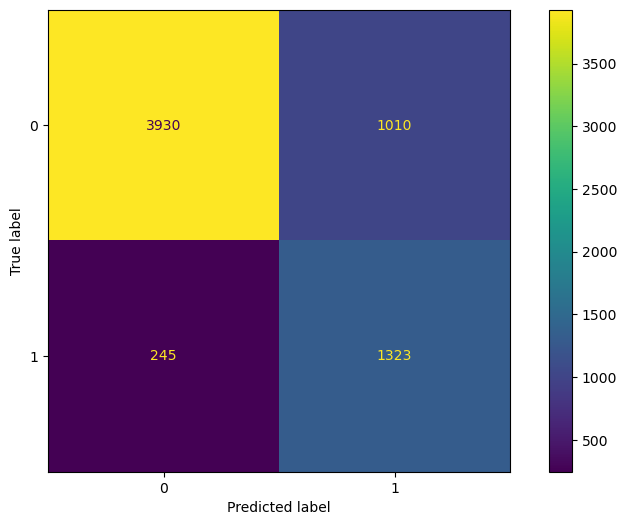

In [106]:
plot_confusion_matrix(grid_model, X_test, y_test)

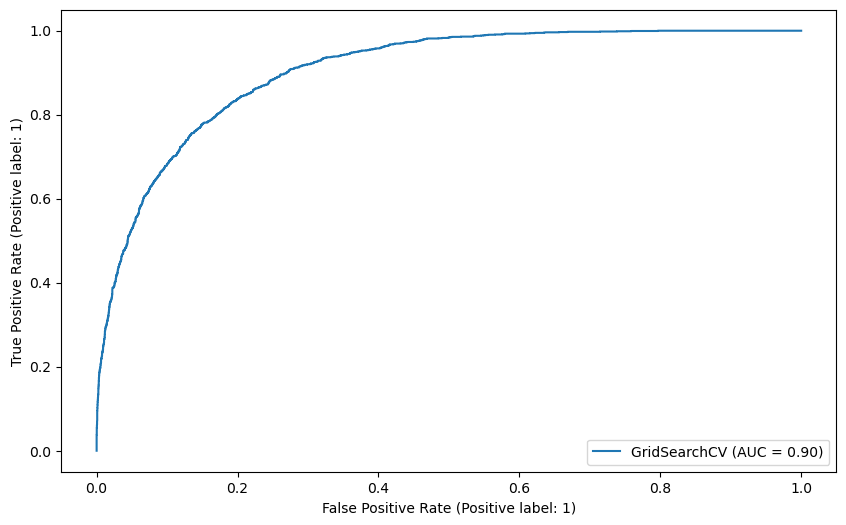

In [107]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(grid_model, X_test, y_test); 


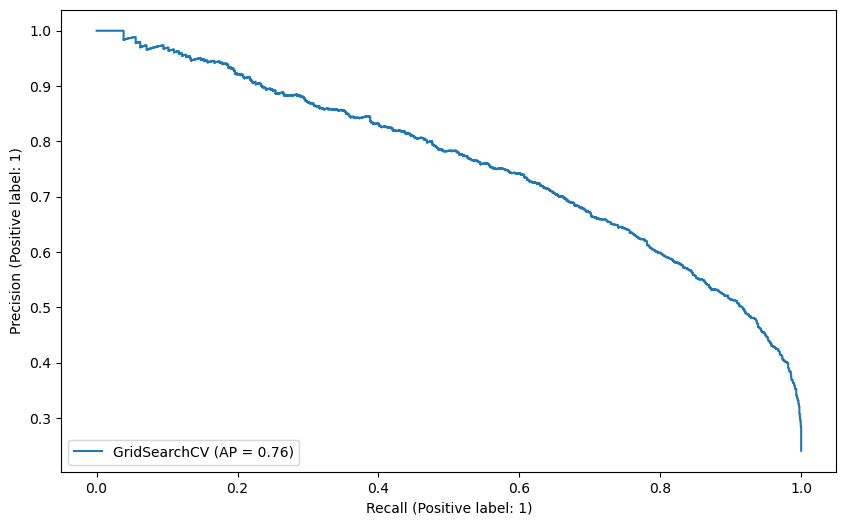

In [108]:
from sklearn.metrics import plot_precision_recall_curve

plot_precision_recall_curve(grid_model, X_test, y_test);

# dengeli data setlerinde hem AUC score hem de Average precision score birbirlerine yakın değerler döndürse de
# dengeli data setleri için AUC, dengesiz veri setleri için average precision scorlarını kullanmayı alışkanlık haline getirelim.

# K-Nearest Neighbors (KNN) Classification

## Marcus hocanın notebook alıntısı
**Bana komşunu söyle, sana kim olduğunu söyleyim!!**

**Temel prensip:** KNN, bir veri noktasının "komşularına" benzer olduğu temeline dayanır. Bir veri noktası için bir tahmin yaparken, KNN algoritması bu veri noktasına en yakın olan 'K' veri noktasını bulur ve bu komşuların özelliklerini temel alarak bir tahminde bulunur. 

**Sınıflandırma ve regresyon:** KNN, sınıflandırma ve regresyon problemlerinde kullanılabilir. Sınıflandırma için, en yakın 'K' komşuların en yaygın sınıfı tahmin edilen sınıf olur. Regresyon için, 'K' komşuların ortalaması tahmin edilen değer olur.

**Mesafe ölçümü:** KNN'nin performansı, komşuların seçimi ve bu komşular arasındaki mesafeyi ölçmek için kullanılan metriğe bağlıdır. Genellikle kullanılan mesafe metrikleri Öklidyen, Manhattan ve Minkowski'dir.

**K değerinin seçimi:** K değeri, modelin karmaşıklığını ve performansını etkileyen önemli bir parametredir. Küçük bir K değeri, overfitting yol açabilir, büyük bir K değeri ise modelin daha genelleştirilmiş bir tahmin yapmasına -underfitting- neden olabilir. En iyi K değerini belirlemek genellikle cross validation ile bulunur.

**Ölçeklendirme-Scale:** KNN, özelliklerin ölçeğine duyarlıdır. Özellikler arasında büyük ölçek farklılıkları varsa, ölçeklendirmenin eksikliği modelin performansını olumsuz etkileyebilir. Bu nedenle, KNN uygulanmadan önce özelliklerin genellikle normalleştirilmesi veya standartlaştırılması önerilir.


**Öklidyen Mesafesi:** İki nokta arasındaki doğru çizgi üzerindeki mesafeyi ölçer. Genellikle iki boyutlu bir düzlemde düşündüğümüz en 'doğal' mesafe budur. Öklidyen mesafesi, iki nokta arasındaki en kısa yol olarak da düşünülebilir. 

**Manhattan Mesafesi:** İki nokta arasındaki mesafeyi, bir ızgara üzerinde yatay ve dikey olarak hareket ederek ölçer.

**Minkowski Mesafesi:** Öklidyen ve Manhattan mesafeleri aslında genel bir mesafe ölçümü olan Minkowski mesafesinin özel durumlarıdır. 

**p** değeri bir parametredir: **p = 2** olduğunda, Minkowski mesafesi Öklidyen mesafeye dönüşür; **p = 1** olduğunda Manhattan mesafesine dönüşür.

In [109]:
from sklearn.neighbors import KNeighborsClassifier

In [110]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier())]

knn_pipe = Pipeline(steps=operations)

knn_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ('knn', KNeighborsClassifier())])

In [111]:
y_pred = knn_pipe.predict(X_test)

In [112]:
y_pred_proba = knn_pipe.predict_proba(X_test)

In [113]:
pd.DataFrame(y_pred_proba)

# modelimizde weights= uniform ve komşu sayısı 5 olduğundan 1. gözlemin etrafındaki 5 komşudan 2'si 1 classına (0.4) aitken
# 3 tanesi 0 classına (0.6) aitmiş. Bu sebeple 0.6 olasılıkla 1 classına atamasını yapacak.

,0,1
0,1.0,0.0
1,1.0,0.0
2,0.4,0.6
3,1.0,0.0
4,1.0,0.0
...,...,...
6503,0.2,0.8
6504,1.0,0.0
6505,0.0,1.0
6506,0.8,0.2


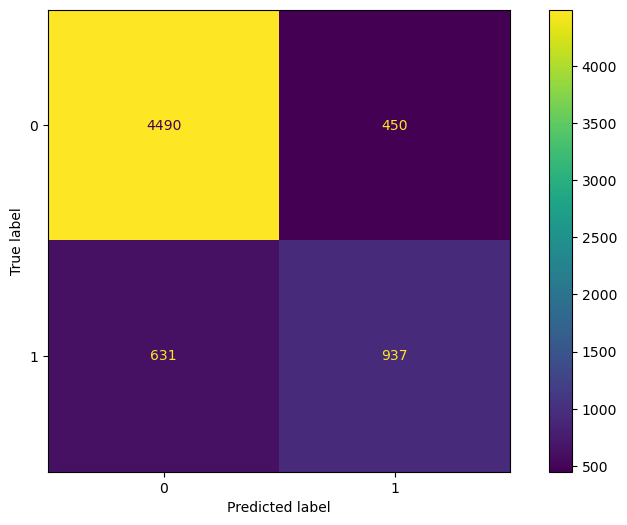

In [114]:
plot_confusion_matrix(knn_pipe, X_test, y_test);

In [115]:
eval_metric(knn_pipe, X_train, y_train, X_test, y_test)

Test_Set
[[4490  450]
 [ 631  937]]
              precision    recall  f1-score   support

           0       0.88      0.91      0.89      4940
           1       0.68      0.60      0.63      1568

    accuracy                           0.83      6508
   macro avg       0.78      0.75      0.76      6508
weighted avg       0.83      0.83      0.83      6508


Train_Set
[[18490  1268]
 [ 1860  4411]]
              precision    recall  f1-score   support

           0       0.91      0.94      0.92     19758
           1       0.78      0.70      0.74      6271

    accuracy                           0.88     26029
   macro avg       0.84      0.82      0.83     26029
weighted avg       0.88      0.88      0.88     26029



# 1'st assumption
### First assumption is that both 0 and 1 results are equally important to check the criterias for having lower income or higher income values than 50k usd per year. 
### If so , Macro avg values should be our priority. Since, the data is imbalanced and both parameters are important.
### When macro avg checked for train and test values for knn modeling with default parameters like k = 5. There is an obvious slight overfitting, due to 0.78-0.75 values for test and 0.84-0.82 values for train data.

# 2'nd assumption
### The second possible assumption is only high income targets are our priority to see the effects on having high income.
### Then precision and recall values for 1 is more important than the other parameters. F1-score is also an option since, it is an harmonic avg. of precision and recall.
### If so, there is a significant overfitting, due to train values are around 0.7-0.78 and test values are around 0.6-0.68.

## Gridsearch Method to find optimum K values (very long way to find optimum K values)

In [116]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier())]
knn_model = Pipeline(steps=operations)

In [117]:
knn_model.get_params()

{'memory': None,
 'steps': [('scaler', StandardScaler()), ('knn', KNeighborsClassifier())],
 'verbose': False,
 'scaler': StandardScaler(),
 'knn': KNeighborsClassifier(),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'knn__algorithm': 'auto',
 'knn__leaf_size': 30,
 'knn__metric': 'minkowski',
 'knn__metric_params': None,
 'knn__n_jobs': None,
 'knn__n_neighbors': 5,
 'knn__p': 2,
 'knn__weights': 'uniform'}

In [118]:
k_values= range(1,10)

# k values shouldn't be too large 1-10 is more than enough.

In [119]:
param_grid = {"knn__n_neighbors":k_values, "knn__p": [1,2], "knn__weights": ['uniform', "distance"]}

# KNN için en önemli olan hyper_parametrelerimiz:
# 1. n_neighbors (binary modellerde classlar arasında eşitlik olmaması için tek sayı olmasına dikkat edilmelidir.
#Multiclass  datalarda tek veya çift olması farketmez.)
# 2. weights uniform=eşit ağırlık verir, distance= mesafeye göre ağırlık verir, yakına daha fazla
# 3. p'dir. p=2 euclidien metriği p=1 manhattan metriği, p=0 minkowski metriği

In [120]:
knn_grid_model = GridSearchCV(knn_model, param_grid, cv=10, scoring = "recall", return_train_score=True, n_jobs=-1)

In [121]:
knn_grid_model.fit(X_train, y_train)

# GridsearchCV herzaman en düşük error scorunu verecek olan maximum metric scorunu döndürür. GridsearchCV sonrası bulacağımız.
# n_neighbors sayısı çok maaliyetli olabileceğinden elbow metoduyla seçmek best practice dir.
# Very long run !!! 

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('knn', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid={'knn__n_neighbors': range(1, 10), 'knn__p': [1, 2],
                         'knn__weights': ['uniform', 'distance']},
             return_train_score=True, scoring='recall')

In [122]:
knn_grid_model.best_params_

{'knn__n_neighbors': 5, 'knn__p': 2, 'knn__weights': 'uniform'}

In [123]:
knn_grid_model.best_estimator_

Pipeline(steps=[('scaler', StandardScaler()), ('knn', KNeighborsClassifier())])

In [124]:
knn_grid_model.best_index_

18

In [125]:
pd.DataFrame(knn_grid_model.cv_results_).loc[32, ["mean_test_score", "mean_train_score"]]

mean_test_score     0.594642
mean_train_score    0.653449
Name: 32, dtype: object

In [126]:
knn_grid_model.best_score_

0.6080427980779975

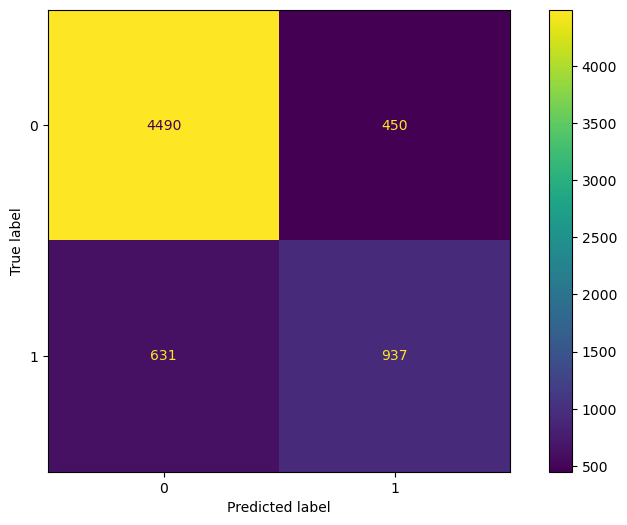

In [127]:
plot_confusion_matrix(knn_grid_model, X_test, y_test)

In [128]:
print('WITH K=9\n')
eval_metric(knn_grid_model, X_train, y_train, X_test, y_test)

WITH K=9

Test_Set
[[4490  450]
 [ 631  937]]
              precision    recall  f1-score   support

           0       0.88      0.91      0.89      4940
           1       0.68      0.60      0.63      1568

    accuracy                           0.83      6508
   macro avg       0.78      0.75      0.76      6508
weighted avg       0.83      0.83      0.83      6508


Train_Set
[[18490  1268]
 [ 1860  4411]]
              precision    recall  f1-score   support

           0       0.91      0.94      0.92     19758
           1       0.78      0.70      0.74      6271

    accuracy                           0.88     26029
   macro avg       0.84      0.82      0.83     26029
weighted avg       0.88      0.88      0.88     26029



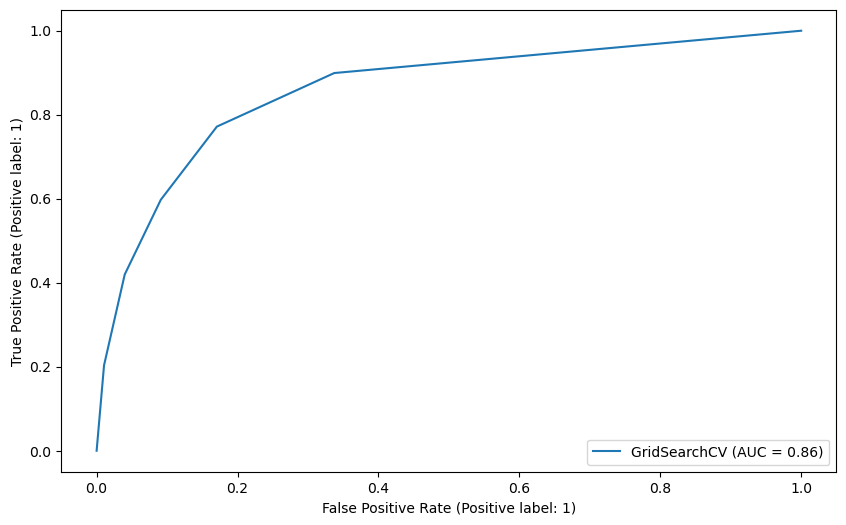

In [129]:
plot_roc_curve(knn_grid_model, X_test, y_test)

In [130]:
y_pred_proba = knn_grid_model.predict_proba(X_test)
roc_auc_score(y_test, y_pred_proba[:,1])

0.8592775938816821

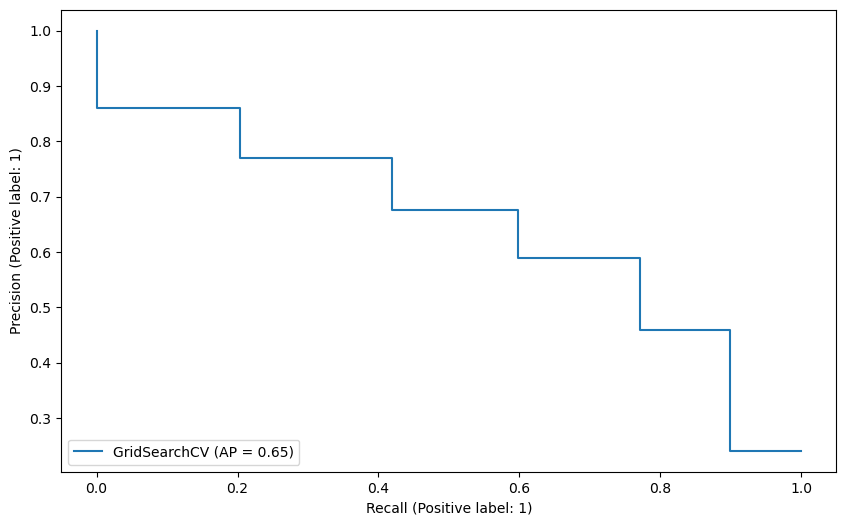

In [131]:
plot_precision_recall_curve(knn_grid_model, X_test, y_test);

## Elbow method to find optimum k values

In [132]:
test_error_rates = []


for k in range(1,10):
    
    operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=k))]

    knn_pipe_model = Pipeline(steps=operations)
    
    scores = cross_validate(knn_pipe_model, X_train, y_train, scoring = ['recall'], cv = 5)
    
    recall_mean = scores["test_recall"].mean() 
    
    test_error = 1 - recall_mean
    
    test_error_rates.append(test_error)
    
# Optimum K değerini seçmek için öncelikle datamız dengeli ise accuracy metricini, dengesiz ise hedef classımızın recall
# metriğini kullanabiliriz.

# Her komşu sayısı(1-10 arasında) için önce recall scorunu bulup daha sonra bu scoru 1'den çıkararak her K değeri için
# error scorumuzu buluyoruz.

# ÇOK ÖNEMLİ NOT: test datasında (hold out set) üzerinden bulacağımız en optimum K değeri data leakage sorununa neden 
# olabileceğinden train datamızı CV'da verip burdaki validation setinin ortalama error scorlarına göre karar vereceğiz.

# Modelin performansını değerlendirirken ve en iyi parametreleri (bu durumda en iyi K değerini) belirlerken, 
# sadece eğitim verisini kullanmalıyız. Test verisini kullanarak bu tür bir parametre ayarlaması yapmak, 
# veri sızıntısına yol açabilir. Bu nedenle, modelin performansını ve en iyi parametreleri değerlendirirken 
# cross validation kullanmalıyız. Bu, modelin gerçek performansını daha doğru bir şekilde yansıtır.

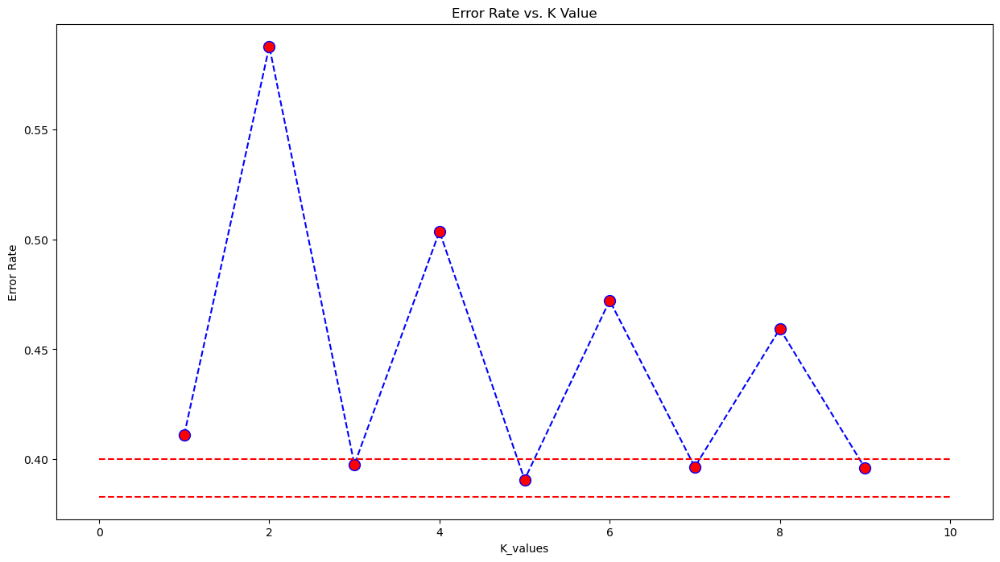

In [133]:
plt.figure(figsize=(15,8))
plt.plot(range(1,10), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)

plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')
plt.hlines(y=0.4, xmin = 0, xmax = 10, colors= 'r', linestyles="--")
plt.hlines(y=0.383, xmin = 0, xmax = 10, colors= 'r', linestyles="--")

# Bulduğumuz error scorlarını görselleştiriyoruz.

In [137]:
test_error_rates = []
train_error_rates = []

for k in range(1,10):
    
    operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=k))]
    knn_pipe_model = Pipeline(steps=operations)
    
    knn_pipe_model.fit(X_train,y_train) 
    
    scores = cross_validate(knn_pipe_model, X_train, y_train, scoring = ['recall'], cv = 5, return_train_score=True)
    
    recall_test_mean = scores["test_recall"].mean() 
    recall_train_mean = scores["train_recall"].mean() 

    
    test_error = 1 - recall_test_mean
    train_error = 1 - recall_train_mean
    test_error_rates.append(test_error)
    train_error_rates.append(train_error)
    
# Yukarıda yaptığımız işlemin aynısını CV'da verdiğimiz train datası üzerinden elde ettiğimiz validation ve train datalarının
# ortalama error hatalarını karşılaştırıyoruz. Böylece overiftingi olup olmadığını daha rahat görebileceğiz.

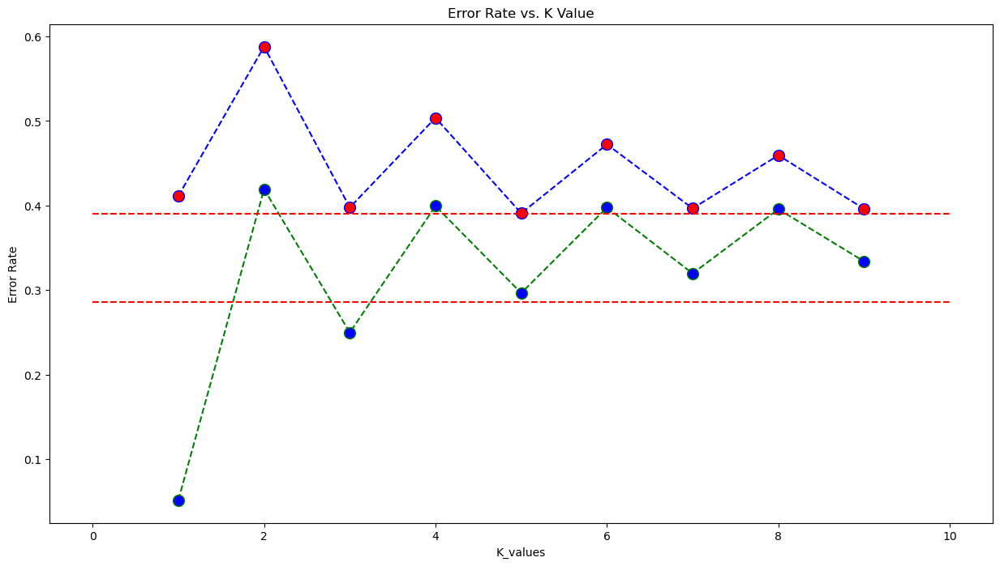

In [138]:
plt.figure(figsize=(15,8))
plt.plot(range(1,10), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)

plt.plot(range(1,10), train_error_rates, color='green', linestyle='--', marker='o',
         markerfacecolor='blue', markersize=10)

plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')
plt.hlines(y=0.39, xmin = 0, xmax = 10, colors= 'r', linestyles="--")
plt.hlines(y=0.286, xmin = 0, xmax = 10, colors= 'r', linestyles="--")

# Kırmızılar validation datası, maviler train datasına ait scorlar.

In [140]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=3))]
knn3 = Pipeline(steps=operations)

knn3.fit(X_train, y_train)
print('WITH K=3\n')
eval_metric(knn3, X_train, y_train, X_test, y_test)

WITH K=3

Test_Set
[[4433  507]
 [ 630  938]]
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      4940
           1       0.65      0.60      0.62      1568

    accuracy                           0.83      6508
   macro avg       0.76      0.75      0.75      6508
weighted avg       0.82      0.83      0.82      6508


Train_Set
[[18621  1137]
 [ 1583  4688]]
              precision    recall  f1-score   support

           0       0.92      0.94      0.93     19758
           1       0.80      0.75      0.78      6271

    accuracy                           0.90     26029
   macro avg       0.86      0.85      0.85     26029
weighted avg       0.89      0.90      0.89     26029



In [141]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=5))]
knn5 = Pipeline(steps=operations)

knn5.fit(X_train, y_train)
print('WITH K=5\n')
eval_metric(knn5, X_train, y_train, X_test, y_test)

WITH K=5

Test_Set
[[4490  450]
 [ 631  937]]
              precision    recall  f1-score   support

           0       0.88      0.91      0.89      4940
           1       0.68      0.60      0.63      1568

    accuracy                           0.83      6508
   macro avg       0.78      0.75      0.76      6508
weighted avg       0.83      0.83      0.83      6508


Train_Set
[[18490  1268]
 [ 1860  4411]]
              precision    recall  f1-score   support

           0       0.91      0.94      0.92     19758
           1       0.78      0.70      0.74      6271

    accuracy                           0.88     26029
   macro avg       0.84      0.82      0.83     26029
weighted avg       0.88      0.88      0.88     26029



In [194]:
image.save("output_image.png")

In [142]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=7))]
knn7 = Pipeline(steps=operations)

knn7.fit(X_train, y_train)
print('WITH K=7\n')
eval_metric(knn7, X_train, y_train, X_test, y_test)

WITH K=7

Test_Set
[[4512  428]
 [ 630  938]]
              precision    recall  f1-score   support

           0       0.88      0.91      0.90      4940
           1       0.69      0.60      0.64      1568

    accuracy                           0.84      6508
   macro avg       0.78      0.76      0.77      6508
weighted avg       0.83      0.84      0.83      6508


Train_Set
[[18463  1295]
 [ 2001  4270]]
              precision    recall  f1-score   support

           0       0.90      0.93      0.92     19758
           1       0.77      0.68      0.72      6271

    accuracy                           0.87     26029
   macro avg       0.83      0.81      0.82     26029
weighted avg       0.87      0.87      0.87     26029



In [143]:
operations = [("scaler", StandardScaler()), ("knn", KNeighborsClassifier(n_neighbors=9))]
knn9 = Pipeline(steps=operations)

knn9.fit(X_train, y_train)
print('WITH K=9\n')
eval_metric(knn7, X_train, y_train, X_test, y_test)

WITH K=9

Test_Set
[[4512  428]
 [ 630  938]]
              precision    recall  f1-score   support

           0       0.88      0.91      0.90      4940
           1       0.69      0.60      0.64      1568

    accuracy                           0.84      6508
   macro avg       0.78      0.76      0.77      6508
weighted avg       0.83      0.84      0.83      6508


Train_Set
[[18463  1295]
 [ 2001  4270]]
              precision    recall  f1-score   support

           0       0.90      0.93      0.92     19758
           1       0.77      0.68      0.72      6271

    accuracy                           0.87     26029
   macro avg       0.83      0.81      0.82     26029
weighted avg       0.87      0.87      0.87     26029



### 5-7-9 values for k neighbours is almost same very very close. 3 is underperformed little bit.
### for very similar output we choose minimum k values to avoid any further possible inconsistencies.
### So, k = 5 is choosen from knn modeling, since both gridsearchCV recommended k = 5 and also values are very similar to k = 7 and k = 9 but choosing k high can cause inconsistency for future data.

# Decision Tree Classification

# Remainder !!! from instructor Marcus's notebook.

**Karar Ağaçları'nın Genel Özellikleri:**
   - Karar Ağaçları, özelliklerin belirli bir sıralamaya veya hiyerarşiye dayalı olarak ayrıldığı hiyerarşik bir yapıdır. Ağaç, en üstteki root node ile başlar ve sonunda hedef değişkenin değerlerine karşılık gelen son düğümlere (leaf node) bölünür.
   - Her bir düğümde, bir özellik belirli bir kriter (genellikle bir eşik değer) temelinde veriyi ikiye böler. Bu bölünme kriteri, genellikle information gane, Gini impurity veya entropy gibi metriklere dayanır.

**Karar Ağaçları'nın Özel Özellikleri:**
   - **Anlaşılabilirlik**: Karar Ağaçları, diğer birçok makine öğrenmesi modeliyle karşılaştırıldığında oldukça anlaşılır ve yorumlanabilir. Ağacın yapısını ve özelliklerin nasıl ayrıldığını görselleştirebilirsiniz, bu da modelin kararlarını anlamanızı kolaylaştırır.
   - **Feature importance**: Karar Ağaçları, her bir özelliğin hedef değişken üzerindeki etkisini ölçmek için bir "feature importance" sağlar. Bu, hangi özelliklerin model için en önemli olduğunu anlamanıza yardımcı olur.
   - **Overfitting**: Karar Ağaçları, verilere aşırı uyuma eğilimlidir, özellikle ağacın derinliği kontrol edilmezse. Bu, ağacın eğitim verilerini çok iyi öğrenmesi ancak yeni verilerde iyi performans gösterememesi anlamına gelir. Bu problem genellikle ağacın maksimum derinliğini sınırlayarak hafifletilir.

Karar Ağaçları, hem tek başına hem de Random Forest veya Gradient Boosting gibi ensemble metotların bir parçası olarak kullanılabilir. Ensemble metotlar genellikle, overfitting azaltmak ve genel performansı artırmak için birden çok karar ağacını bir araya getirir.

Evet, tabii ki. Information Gain, Gini Index ve Entropy, karar ağaçları algoritmasında bir düğümde hangi özelliğin bölünme kriteri olacağını belirlemek için kullanılan üç önemli metriktir. Bunlar, bölünme kriterlerinin etkinliğini ölçmeye yardımcı olur.

**Information Gain (Bilgi Kazancı):**
   - Bilgi Kazancı, bir özelliğin bölünmesi sonucu elde edilen bilgi miktarını ölçer. Bir özelliğin bölünmesi, hedef değişkende belirli bir düzeni veya düzeni ortaya çıkarabilir. Bilgi Kazancı, bölünme öncesi ve sonrası belirsizliği (genellikle entropy ile ölçülür) karşılaştırarak bu bilgi miktarını ölçer. Bilgi Kazancı ne kadar yüksek olursa, o özellik o kadar bilgilendiricidir.
   - Bu metriği maksimize etmeye çalışırız. Yüksek bilgi kazancı, belirgin bir düzen veya yapının ortaya çıktığı anlamına gelir, bu da genellikle modelimizin genel performansını artırır.

**Gini Index (Gini İndeksi):**
   - Gini İndeksi, bir özelliğin bölünmesi sonucu elde edilen "saf olmayanlık" miktarını ölçer. Saf olmayanlık, bir düğümdeki sınıfların karışıklığı veya karışımını ifade eder. Gini İndeksi, bir özelliğin bölünmesi sonucunda sınıfların ne kadar iyi ayrıldığını ölçer. Gini İndeksi ne kadar düşük olursa, o özellik o kadar bilgilendiricidir.
   - Bu metriği minimize etmeye çalışırız. Düşük bir Gini İndeksi, bir düğümün "saf" olduğunu gösterir, yani bir sınıfın örneklerini diğerlerinden iyi bir şekilde ayırabilir.

**Entropy (Entropi):**
   - Entropi, bir sistemdeki belirsizliği veya düzensizliği ölçen bir metriktir. Karar ağaçları bağlamında, bir düğümdeki belirsizlik miktarını ölçer. Bir özelliğin bölünmesi, bu belirsizliği azaltabilir ve bu da hedef değişkendeki düzeni ortaya çıkarabilir. Entropi, aynı şekilde Bilgi Kazancı'nın hesaplanmasında da kullanılır.
   - Bu metriği de minimize etmeye çalışırız. Düşük entropi, düşük belirsizlik anlamına gelir, bu da genellikle daha iyi model performansı anlamına gelir.

In [144]:
dt_model = DecisionTreeClassifier(random_state=101)

In [145]:
dt_model.fit(X_train, y_train)

DecisionTreeClassifier(random_state=101)

In [146]:
y_pred = dt_model.predict(X_test)
y_train_pred = dt_model.predict(X_train)

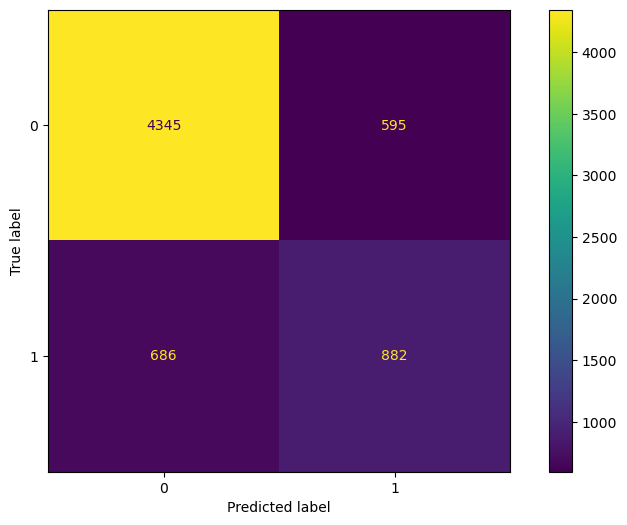

In [147]:
plot_confusion_matrix(dt_model,X_test,y_test)

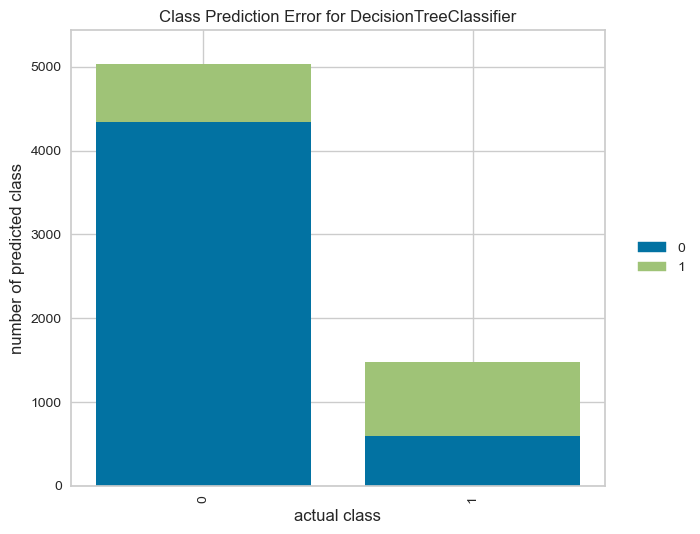

In [148]:
from yellowbrick.classifier import ClassPredictionError

visualizer = ClassPredictionError(dt_model)

# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)

# Evaluate the model on the test data
visualizer.score(X_test, y_test)

# Draw visualization
visualizer.poof();

### Blue is 0 and green 1 so in the 0 bar blues are correct. However, in the 1 bar greens are correct and blues are wrong!

In [149]:
eval_metric(dt_model, X_train, y_train, X_test, y_test)

Test_Set
[[4345  595]
 [ 686  882]]
              precision    recall  f1-score   support

           0       0.86      0.88      0.87      4940
           1       0.60      0.56      0.58      1568

    accuracy                           0.80      6508
   macro avg       0.73      0.72      0.73      6508
weighted avg       0.80      0.80      0.80      6508


Train_Set
[[19640   118]
 [  569  5702]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98     19758
           1       0.98      0.91      0.94      6271

    accuracy                           0.97     26029
   macro avg       0.98      0.95      0.96     26029
weighted avg       0.97      0.97      0.97     26029



## Cross validate for decision tree model

In [150]:
scores = cross_validate(dt_model, X_train, y_train, scoring = ["accuracy", "precision_micro", "recall_micro", "f1_micro"], 
                        cv = 10, return_train_score=True)

df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

,fit_time,score_time,test_accuracy,train_accuracy,test_precision_micro,train_precision_micro,test_recall_micro,train_recall_micro,test_f1_micro,train_f1_micro
1,0.179225,0.006760,0.811371,0.974772,0.811371,0.974772,0.811371,0.974772,0.811371,0.974772
2,0.149668,0.007943,0.794852,0.975198,0.794852,0.975198,0.794852,0.975198,0.794852,0.975198
3,0.161530,0.008958,0.792163,0.974772,0.792163,0.974772,0.792163,0.974772,0.792163,0.974772
4,0.144483,0.008950,0.797541,0.975156,0.797541,0.975156,0.797541,0.975156,0.797541,0.975156
5,0.173121,0.012966,0.804841,0.974772,0.804841,0.974772,0.804841,0.974772,0.804841,0.974772
6,0.165909,0.008940,0.798694,0.974857,0.798694,0.974857,0.798694,0.974857,0.798694,0.974857
7,0.170174,0.008018,0.794852,0.975070,0.794852,0.975070,0.794852,0.975070,0.794852,0.975070
8,0.141467,0.007027,0.800615,0.975753,0.800615,0.975753,0.800615,0.975753,0.800615,0.975753
9,0.167081,0.007977,0.798310,0.974985,0.798310,0.974985,0.798310,0.974985,0.798310,0.974985
10,0.148915,0.010006,0.800922,0.974559,0.800922,0.974559,0.800922,0.974559,0.800922,0.974559


In [151]:
df_scores.mean()[2:]

test_accuracy            0.799416
train_accuracy           0.974989
test_precision_micro     0.799416
train_precision_micro    0.974989
test_recall_micro        0.799416
train_recall_micro       0.974989
test_f1_micro            0.799416
train_f1_micro           0.974989
dtype: float64

In [152]:
def report_model(model):
    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train)
    print('\n')
    print(eval_metric(model, X_train, y_train, X_test, y_test))
    print('\n')
    plt.figure(figsize=(12,8),dpi=100)
    plot_tree(model,filled=True, feature_names=X.columns, fontsize=10);

In [153]:
pruned_tree = DecisionTreeClassifier(max_depth=3, random_state=101)
pruned_tree.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=3, random_state=101)

In [166]:
eval_metric(pruned_tree, X_train, y_train, X_test, y_test)

Test_Set
[[4679  261]
 [ 767  801]]
              precision    recall  f1-score   support

           0       0.86      0.95      0.90      4940
           1       0.75      0.51      0.61      1568

    accuracy                           0.84      6508
   macro avg       0.81      0.73      0.76      6508
weighted avg       0.83      0.84      0.83      6508


Train_Set
[[18634  1124]
 [ 3040  3231]]
              precision    recall  f1-score   support

           0       0.86      0.94      0.90     19758
           1       0.74      0.52      0.61      6271

    accuracy                           0.84     26029
   macro avg       0.80      0.73      0.75     26029
weighted avg       0.83      0.84      0.83     26029



## Train values are much worse than unlimited max_depth DecisinTree function. However, much better consistency between Train and Test values. 

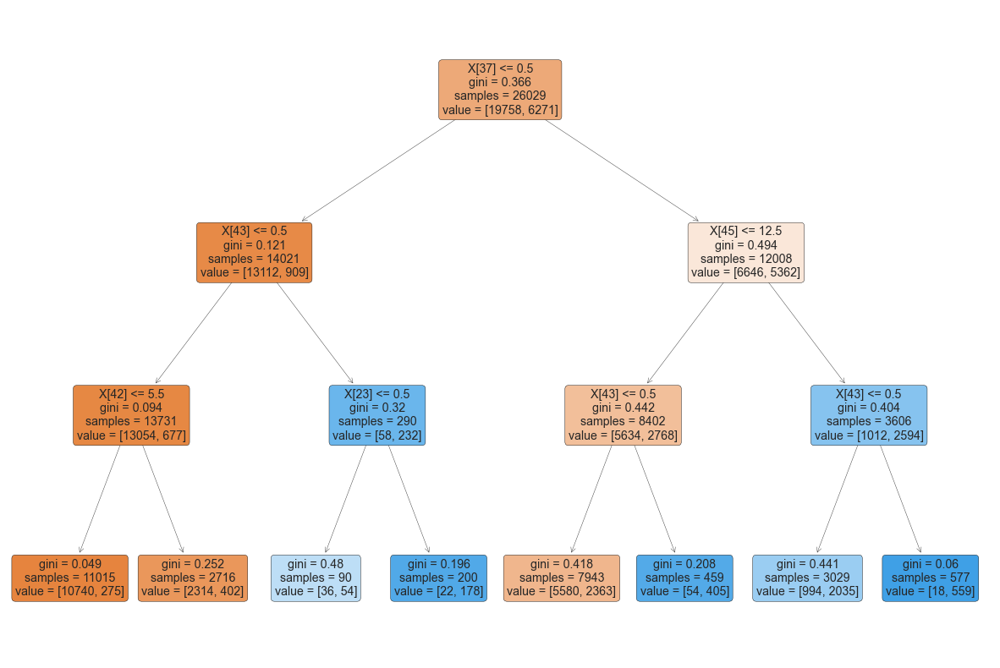

In [167]:
from sklearn.tree import plot_tree
plt.figure(figsize=(15,10))
plot_tree(pruned_tree, filled = True, rounded = True)
plt.show();



Test_Set
[[4679  261]
 [ 767  801]]
              precision    recall  f1-score   support

           0       0.86      0.95      0.90      4940
           1       0.75      0.51      0.61      1568

    accuracy                           0.84      6508
   macro avg       0.81      0.73      0.76      6508
weighted avg       0.83      0.84      0.83      6508


Train_Set
[[18634  1124]
 [ 3040  3231]]
              precision    recall  f1-score   support

           0       0.86      0.94      0.90     19758
           1       0.74      0.52      0.61      6271

    accuracy                           0.84     26029
   macro avg       0.80      0.73      0.75     26029
weighted avg       0.83      0.84      0.83     26029

None




IndexError: index 37 is out of bounds for axis 0 with size 12

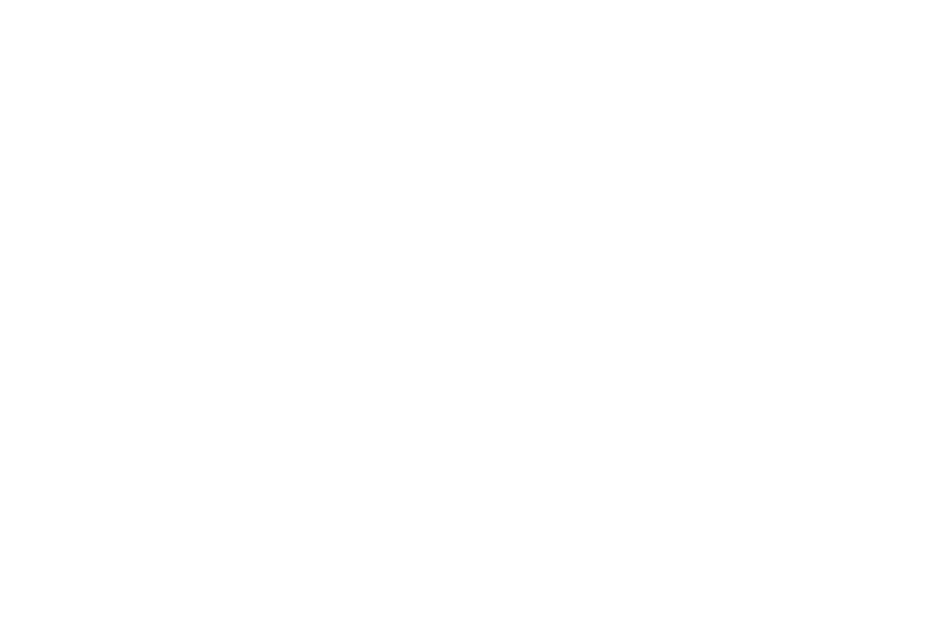

In [163]:
report_model(pruned_tree)

## GridsearchCV

In [168]:
dt_model = DecisionTreeClassifier()

In [169]:
dt_model.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

## Remainder !!!
**splitter:** Karar ağacının her düğümündeki bölünmeyi belirler. "Best" seçeneği en iyi bölünmeyi (en yüksek information gain veya en düşük Gini index gibi) bulmaya çalışırken, "random" seçeneği rastgele bir bölünme seçer.

**max_features:** Her düğümdeki bölünme için dikkate alınacak maksimum özellik sayısını belirler. "Auto" seçeneği, özelliklerin kök karesini dikkate alır. "None" seçeneği ise tüm özellikleri dikkate alır.

**max_depth:** Karar ağacının maksimum derinliğini belirler. None seçeneği, tüm düğümler saf hale gelene kadar ağacın genişlemesine izin verir. Bir sayı belirtilirse, ağaç belirtilen derinliğe kadar genişler.

**min_samples_leaf:** Bir düğümün yaprak düğüm olabilmesi için gereken minimum örnek sayısını belirler. Bu parametre de  overfitting önlemeye yardımcı olabilir.

**min_samples_split:** Bir düğümün bölünebilmesi için gereken minimum örnek sayısını belirler. Bu parametre de overfitting önlemeye yardımcı olabilir.

**class_weight:** Sınıfların dengesiz olduğu durumlarda kullanılır. "Balanced" seçeneği, sınıfların frekansına ters orantılı ağırlıklar atar. None seçeneği, tüm sınıflara eşit ağırlık atar.

## For param grid these features are loaded to GridSearchCV to check best ones 

In [170]:
param_grid = {"splitter":["best", "random"],
              "max_features":[None, "auto"],
              "max_depth": [None, 2, 3],
              "min_samples_leaf": [3,4,5],
              "min_samples_split": [3,5,6],
              'class_weight': [None, "balanced"]}

In [171]:
grid_model = GridSearchCV(estimator=dt_model,
                          param_grid=param_grid,
                          scoring='recall',
                          cv=10,
                          n_jobs = -1,
                          return_train_score=True)

In [172]:
grid_model.fit(X_train, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'class_weight': [None, 'balanced'],
                         'max_depth': [None, 2, 3],
                         'max_features': [None, 'auto'],
                         'min_samples_leaf': [3, 4, 5],
                         'min_samples_split': [3, 5, 6],
                         'splitter': ['best', 'random']},
             return_train_score=True, scoring='recall')

In [173]:
grid_model.best_index_

144

In [174]:
pd.DataFrame(grid_model.cv_results_).loc[153, ["mean_test_score", "mean_train_score"]]

mean_test_score     0.889171
mean_train_score    0.889633
Name: 153, dtype: object

In [175]:
grid_model.best_score_

0.8920417720618861

In [176]:
grid_model.best_params_

{'class_weight': 'balanced',
 'max_depth': 2,
 'max_features': None,
 'min_samples_leaf': 3,
 'min_samples_split': 3,
 'splitter': 'best'}

In [177]:
grid_model.best_estimator_

DecisionTreeClassifier(class_weight='balanced', max_depth=2, min_samples_leaf=3,
                       min_samples_split=3)

In [186]:
## giving the best params from grid_model for decision tree classifier.

model_dt = DecisionTreeClassifier(class_weight='balanced', max_depth=2, min_samples_leaf=3,
                       min_samples_split=3, splitter='best',max_features= None)

In [187]:
model_dt.fit(X_train, y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=2, min_samples_leaf=3,
                       min_samples_split=3)

In [188]:
y_pred = model_dt.predict(X_test)
y_train_pred = model_dt.predict(X_train)

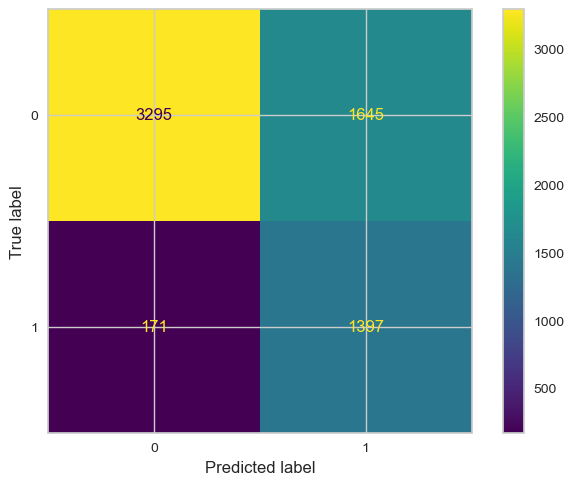

In [189]:
plot_confusion_matrix(model_dt,X_test,y_test)

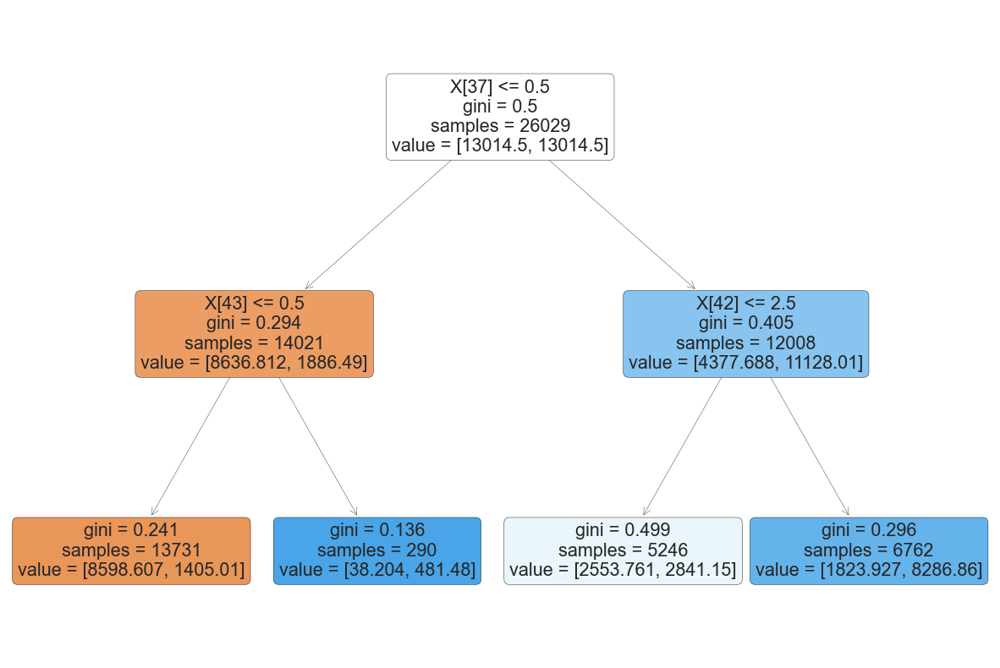

In [190]:
plt.figure(figsize=(15,10))
plot_tree(model_dt, filled = True, rounded = True)
plt.show();

In [191]:
eval_metric(model_dt, X_train, y_train, X_test, y_test)

Test_Set
[[3295 1645]
 [ 171 1397]]
              precision    recall  f1-score   support

           0       0.95      0.67      0.78      4940
           1       0.46      0.89      0.61      1568

    accuracy                           0.72      6508
   macro avg       0.70      0.78      0.70      6508
weighted avg       0.83      0.72      0.74      6508


Train_Set
[[13054  6704]
 [  677  5594]]
              precision    recall  f1-score   support

           0       0.95      0.66      0.78     19758
           1       0.45      0.89      0.60      6271

    accuracy                           0.72     26029
   macro avg       0.70      0.78      0.69     26029
weighted avg       0.83      0.72      0.74     26029



# Final Model

## To decide which one to choose first KNN, decision tree, and logistic regression modeling results should be compared.

## From knn modeling for k = 5

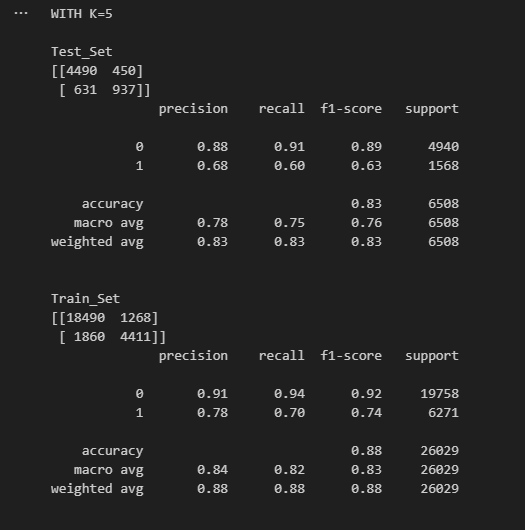

## From Logistic Regression

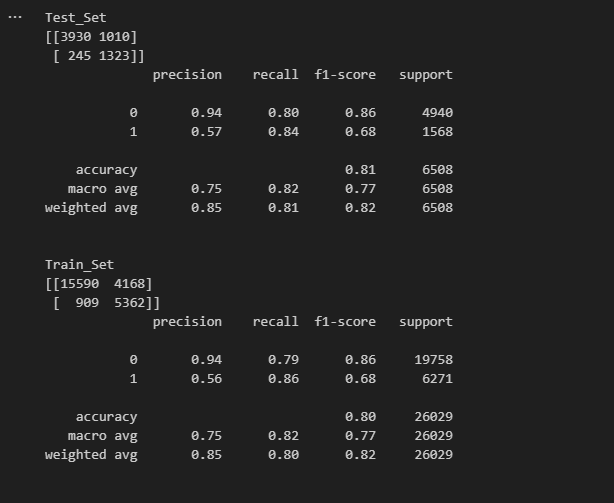

## From decision tree classifier

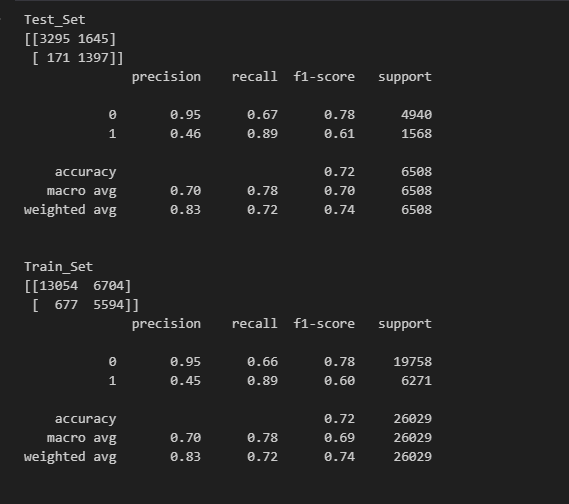

# Result
### Decision depends on the goal,
### Lets consider researchers wanted to learn more about people earn over 50k usd a year, which represented as "1" in our data set.
### If so, the decision tree should be choosen with best score of recall 0.89 for 1 without sign of overfitting. However, some should consider that Logistic Regression modeling recall values are close 0.84 to 0.89 from decision tree classifier, and Logistic Regression considered one of the best technique with strong scientific background. Hence, it can be a very strong option too should be considered. Whereas knn modeling is far worse to predict high earner (over 50k usd per year).